# This notebook generates pi0 plots for specific set of pickles

In [1]:
%matplotlib inline
import platform
print(platform.python_version())
from ROOT import TFile,vector
import ROOT

import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
import math


import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.interpolate import interp1d
from scipy.integrate import quad
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from textwrap import wrap
import copy

import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

3.5.2
Welcome to JupyROOT 6.14/08


In [2]:
# davios functions for plotting...

def Tune1(df):
    return df['xsec_tune1_weight'].values

def CV(df):
    wgt = df['xsec_corr_weight'].values
#     if False:
    if 'new_weight' in df.columns:
        tmpweights1 = df['new_weight'].values

    else:
        tmpweights1 = []
        for i in range(len(wgt)):
            tmpweights1.append(1.0)
    
    if 'pot_weight' in df.columns:
#     if False:
        tmpweights2 = df['pot_weight'].values
    else:
        tmpweights2 = []
        for i in range(len(wgt)):
            tmpweights2.append(1.0)
            
    for i in range(len(wgt)):
        wgt[i] = wgt[i]*tmpweights1[i]*tmpweights2[i]
#         
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    
    return wgt

def Spline(df):
    wgt = df['spline_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    return wgt


class sampHist:

    def __init__(self,samp_df,samp_l,samp_c,samp_wind,samp_s):
        self._df = samp_df.copy()
        self._label = samp_l
        self._color = samp_c
        self._scale = samp_s
        self._wi = samp_wind
        if samp_wind == 0:
            self._wgt = np.ones(len(samp_df))
        if samp_wind == 1:
            self._wgt = CV(samp_df)

    def setweight(self,windex):
        if windex == 0:
            self._wgt = np.ones(len(self._df))
        if windex == 1:
            self._wgt = CV(self._df)

    def dist(self,s_var):
        return self._df[s_var].values

    def cosdist(self,s_var):
        return np.cos(self._df[s_var].values)

    def applycut(self,s_cut):
        newhist = copy.deepcopy(self)
        newhist._df = self._df.query(s_cut)
        newhist.setweight(self._wi)
        return newhist

class SimpleHisto:

    def __init__ (self,df_df,f_scale,i_wgt,s_color,s_label):
        temp_df = df_df.copy()
        temp_df['myscale'] = f_scale
        self.mydf = temp_df
        self.mycolor = s_color
        self.mylabel = s_label
        self.iwgt = i_wgt

        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def GetHist(self,s_varname):
        temp_df = self.mydf.query(self.mycut)
        if self.iwgt == 1:
            myweight = CV(temp_df)
        elif self.iwgt == 0:
            myweight = np.ones(len(temp_df))
        return temp_df[s_varname].values,myweight,temp_df['myscale'].values,self.mycolor,self.mylabel

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

class StackedHisto:

    def  __init__ (self,a_df_mc,a_df_scale):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layeriwgt = []
        self.stratxweight = []

        temp_a_df = []
        for i in range(len(a_df_mc)):
            temp_df = a_df_mc[i].copy()
            temp_df['myscale'] = a_df_scale[i]
            temp_a_df.append(temp_df)
        self.mymc = pd.concat(temp_a_df)
        self.mycut ='shower1_E_Y_new>=0'


    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def AddLayer(self,df_layer,df_scale,i_wgt,s_label,s_color):
        temp_df = df_layer.copy()
        temp_df['myscale'] = df_scale
        self.mylayer.append(temp_df)
        self.layerlabel.append(s_label)
        self.layercolor.append(s_color)
        self.layeriwgt.append(i_wgt)

    def AddStrata(self,s_strata,s_label,s_color,f_wgt=1.0):
        self.mystrata.append(s_strata)
        self.stratalabel.append(s_label)
        self.stratacolor.append(s_color)
        self.stratxweight.append(f_wgt)

    def GetHists(self,s_varname):
        a_vals = []        # (nxN)
        a_wgts = []
        a_scale = []
        a_cols = []        # (nx1)
        a_labels = []

        # first, run  through strata
        for i in range(len(self.mystrata)):
            # isolate this stratum with current cut
            temp_df = self.mymc.query(self.mystrata[i]+' and '+self.mycut)

            a_vals.append(temp_df[s_varname].values)
            a_wgts.append(CV(temp_df) * self.stratxweight[i])   # ah, this is if we want to scale an individual stratum
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.stratacolor[i])
            a_labels.append(self.stratalabel[i])

        for i in range(len(self.mylayer)):
            temp_df = self.mylayer[i].query(self.mycut)

            a_vals.append(temp_df[s_varname].values)
            if self.layeriwgt[i] == 1:
                a_wgts.append(CV(temp_df))
            elif self.layeriwgt[i] == 0:
                a_wgts.append(np.ones(len(temp_df)))
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.layercolor[i])
            a_labels.append(self.layerlabel[i])

        return  np.asarray(a_vals),np.asarray(a_wgts),np.asarray(a_scale),a_cols,a_labels

    def ClearLayers(self):
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layerwgt = []

    def ClearStrata(self):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []


class distVar:

    def __init__(self,s_name,n_range,s_label='',s_cov=''):
        self.myname = s_name
        self.myrange = n_range
        self.myscov = s_cov
        if s_label == '':
            self.mylabel = s_name
        else:
            self.mylabel = s_label
            
def PmuGivenX(mu,x):

    # Returns the probability density value that the true mean is mu given that you
    # have observed x events. Actually employs a series approximation because the real formula
    # involves a very very large numerator and denominator and overflows even high precision
    # variables if your bins contain more than a few hundred events
    # Approximation is good to O(0.1%) or better at all values

    pi  = np.pi
    c   = [1.,-1./12,1./288,139./51840,-571./2488320,-163879./209018880]

    if x == 0:
        return np.exp(-mu)
    else:
        poly = sum(c[i]/x**(i+0.5) for i in range(len(c)))
        return 1/np.sqrt(2*pi)*np.exp(x+x*np.log(mu/x)-mu)*poly


def distplot_wratio_davio(myvar,nbins,myrange,stackedhists,datahist,stxcoord,m_cov,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #consFac is new and consolidates all MC strata whose contribution is less than a given percent threshold.
    # (my legend was too full of useless stuff)

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    data_vals,data_wgt,data_scale,_,data_label = datahist.GetHist(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])


    vals_data_raw,_ = np.histogram(data_vals,nbins,range=myrange,weights=data_wgt)
    vals_data,_ = np.histogram(data_vals,nbins,range=myrange,weights=np.multiply(data_wgt,data_scale))
    bincenters = np.diff(binedges)/2 + binedges[:-1]

    #jarretbars
    a_obslo = []
    a_obshi = []
    for i in range(nbins):
        obslo,obshi = GetErrorsData(vals_data[i])
        a_obshi.append(obshi-vals_data[i])
        a_obslo.append(vals_data[i]-obslo)

    #m_cov is fractional, so we multiply it by MC
    for i in range(nbins):
        for j in range(nbins):
            if(vals_mc[i] > 0 and vals_mc[j] > 0):
                m_cov[i][j] *= vals_mc[i]*vals_mc[j]
#             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
#                 m_cov[i][j] = 0
            else:
                m_cov[i][j] = 0
#             else:
#                 print("uh oh!",vals_mc[i],vals_mc[j] )

    # Normalization uncertainty:
    for i in range(len(m_cov)):
        for j in range(len(m_cov[i])):
            if math.isnan(m_cov[i][j]):
                m_cov[i][j]=0.0000000001
                
    fNorm_squared = m_cov.sum() / np.power(vals_mc.sum(),2)
#     print("first", m_cov)
    print('Normalization Uncertainty:',np.sqrt(fNorm_squared))

    yerr_mc_sys = np.sqrt(np.diag(m_cov))
    yerr_mc_total = np.sqrt(np.diag(m_cov) + yerrsq_mc)
    print("yerr_mc_total", yerr_mc_total)

    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i] + yerrsq_mc[i]
        else:
            m_cov[i][i] += 999

        
    yerr_data = np.sqrt(yerrsq_data)
    print("yerr_data", sum(yerr_data))
    er_rat_line = np.zeros(nbins)
    er_rat_line_sys = np.zeros(nbins)
    er_rat_dotshi = np.zeros(nbins)
    er_rat_dotslo = np.zeros(nbins)

    for i in range(nbins):
        if vals_mc[i] > 0:
            er_rat_line[i] = yerr_mc_total[i]/float(vals_mc[i])
            er_rat_line_sys[i] = yerr_mc_sys[i]/float(vals_mc[i])
            er_rat_dotshi[i] = a_obshi[i]/float(vals_mc[i])
            er_rat_dotslo[i] = a_obslo[i]/float(vals_mc[i])

    chisq = 0.0
    invcov = np.linalg.inv(m_cov)

    # calc chi2
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
                chisq += (vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j]
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    print(chisq/float(ndof),pval)

    fig,ax = plt.subplots(figsize=fs)
    fig.patch.set_alpha(1)
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, .75])
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ymax = max((vals_data+np.asarray(a_obshi)).max(),(vals_mc+yerr_mc_sys).max())*1.4

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax1.set_xlabel(stxcoord,fontsize=20)
    ax0.set_ylabel('Event Count',fontsize=25)
    ax1.set_ylabel('Data/MC',fontsize=25)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax0.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=(a_obslo,a_obshi),color='black',capsize=5,label=data_label+' (%i)'%vals_data.sum(),markersize=8,zorder=20,elinewidth=2)
    ax0.errorbar(bincenters,vals_data,fmt='o',color='white',zorder=19,markersize=18)

    errboxes_tot = []
    errboxes_sys = []

    for i in range(len(bincenters)):
        rect0 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_sys[i])),binedges[i+1]-binedges[i],yerr_mc_sys[i]*2)
        errboxes_sys.append(rect0)
        rect1 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_total[i])),binedges[i+1]-binedges[i],yerr_mc_total[i]*2)
        errboxes_tot.append(rect1)
    pc_sys = PatchCollection(errboxes_tot,facecolor='red', alpha=.3,hatch='X',edgecolor='white')
    pc_sys_outline = PatchCollection(errboxes_tot,facecolor='none', alpha=.9,hatch='X',edgecolor='white',zorder=11)
    pc_tot = PatchCollection(errboxes_sys,facecolor=None,alpha=.1,hatch='/',zorder=12)
    ax0.add_collection(pc_sys)
    ax0.add_collection(pc_sys_outline)
    ax0.add_collection(pc_tot)
    ax0.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0,label='MC Systematic Error')
    ax0.hist(np.zeros(1),(1,2),facecolor='red', alpha=.3,hatch='X',edgecolor='white',label='MC Sys+Stat Error')
    ax0.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    errboxes_rat_tot = []
    errboxes_rat_sys = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys.append(rect1)

    pc_rat_tot = PatchCollection(errboxes_rat_tot, facecolor='red', alpha=.3)
    pc_rat_sys = PatchCollection(errboxes_rat_sys, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax1.add_collection(pc_rat_tot)
    ax1.add_collection(pc_rat_sys)
    ax1.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax1.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)

    #ax1.legend(loc='lower right',fontsize=15,frameon=False)

    ax1.axhline(1,color='black',linestyle=':')
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(vals_mc.sum()),np.sqrt(fNorm_squared)),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))

    ax1.annotate('p-value: %.3f\n'%pval+r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof)),xy=(.85,.7), xycoords='axes fraction',fontsize=17,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)

    plt.tight_layout()

    return fig,ax0,ax1,pval

def distplot_mc(myvar,nbins,myrange,stackedhists,stxcoord,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #for plotting truth variables

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])
   
  

   

    fig,ax = plt.subplots(figsize=fs)

    ymax = (vals_mc).max()*1.4

    ax.set_ylim(0,ymax)
    ax.set_xlim(myrange)
    ax.set_xlabel(stxcoord,fontsize=20)
    ax.set_ylabel('Event Count',fontsize=25)
    ax.set_title('MCC9 MC',fontsize=30)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    
    x_res=[]
    y_res=[]
    for i in range(10):
        x_res.append(0.0)
        y_res.append(i*(ymax)/10.0)
    
    plt.plot(x_res,y_res,'--',color='black',label="resolution = 0.0")

    ax.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    
    plt.tight_layout()

    return fig,ax

In [3]:
NUMU_R1_POT = 4.71579e+20
NUMU_R1_1MIL_POT = 1.33678E+21
NUE_R1_POT  = 9.80259e+22

DETVAR_CV_POT =  9.65858292241e+19

NUMU_R3_POT = 8.98773223801e+20
NUE_R3_POT = 4.707047e+22

NUMU_R2_POT = 4.08963968669e+20
NUMU_R2_1MIL_POT = 1.2992E+21
NUE_R2_POT = 9.2085012316e+22

CCPI0_R1_POT = 6.95344e+20
CCPI0_R3_POT = 5.92213e+20
NCPI0_R1_POT = 2.90401e+21
NCPI0_R3a_POT = 2.62745e+20
NCPI0_R3b_POT = 2.22482e+21

DATA_R1_OPEN_POT = 4.403e+19
DATA_R3_OPEN_POT = 8.786e+18
DATA_R1_PI0FILTER_POT =1.746e+20
DATA_R2D_PI0FILTER_POT = 2.050e+20
DATA_R2E_PI0FILTER_POT = 6.507e+19
DATA_R3F_PI0FILTER_POT = 4.3e+19
DATA_R3G_PI0FILTER_POT = 2e+20

FAKE_DATA_1_RUN1_POT = 1.925e20
FAKE_DATA_1_RUN3_POT = 2.83e20

EXT_R1_PI0FILTER_POT = 22474918.0/41898673.0 * DATA_R1_PI0FILTER_POT 
EXT_R1_OPEN_POT = 22474918.0 / 9776965.0* DATA_R1_OPEN_POT
EXT_R1_FAKE1_POT = 22474918.0 /41898673.0* FAKE_DATA_1_RUN1_POT

EXT_R2D_PI0FILTER_POT =  39566274.0/49422124.0 * DATA_R2D_PI0FILTER_POT
EXT_R2E_PI0FILTER_POT =  39566274.0/19914275.0 * DATA_R2E_PI0FILTER_POT
EXT_R3F_PI0FILTER_POT =  39566274.0/11229268.0 * DATA_R3F_PI0FILTER_POT
EXT_R3G_PI0FILTER_POT =  39566274.0/51705212.0 * DATA_R3G_PI0FILTER_POT
EXT_R3_OPEN_POT = 39566274.0/2263559.0 * DATA_R3_OPEN_POT
EXT_R3_FAKE1_POT = 39566274.0/11229268.0 * FAKE_DATA_1_RUN3_POT

POT_SCALE_FACTOR = 1.0 #if I feel like playing with scaling
# CURRENT TOTAL
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT
print("total POT: ",DATA_POT_TOTAL)
print("1", EXT_R1_PI0FILTER_POT)
print("2", EXT_R2E_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT)
print("3", EXT_R3G_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT)

total POT:  6.8767e+20
1 9.365739776054483e+19
2 2.9340153832119832e+20
3 3.045558940373219e+20


In [4]:
NUMU_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUMU_R1_POT)
NUE_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUE_R1_POT)
EXT_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(EXT_R1_OPEN_POT)
CCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NCPI0_R1_POT)


NUMU_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_POT)
NUMU_R1_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_1MIL_POT)
NUE_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUE_R1_POT)
EXT_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(EXT_R1_PI0FILTER_POT)
CCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NCPI0_R1_POT)

NUMU_R1_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUMU_R1_POT)
NUE_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUE_R1_POT)
EXT_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(EXT_R1_FAKE1_POT)

NUMU_R2D_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUE_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUE_R2_POT)
NUMU_R2D_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
EXT_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(EXT_R2D_PI0FILTER_POT)
NUMU_R2E_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUMU_R2E_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
NUE_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUE_R2_POT)
EXT_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(EXT_R2E_PI0FILTER_POT)

NUMU_R3_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUMU_R3_POT)
NUE_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUE_R3_POT)
EXT_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(EXT_R3_OPEN_POT)
NUMU_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(EXT_R3F_PI0FILTER_POT)
NUMU_R3_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUMU_R3_POT)
NUE_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUE_R3_POT)
EXT_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(EXT_R3_FAKE1_POT)
NUMU_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(EXT_R3G_PI0FILTER_POT)

CCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)
CCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)


NUMU_R3_DETVAR_SCALE = (DETVAR_CV_POT)/ float(NUMU_R3_POT)

In [5]:
# Or, we can load from pickles if you, you know, want to.
# Pickle read for easy access later, eh?

tag = 'Nov_20_run1_numu'
df_numu_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Feb_4_run1_numu'
df_numu_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Feb_5_run1_numu_dlana'
df_numu_1mil_goodruns_pmtprecut_ana = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_nue'
df_nue_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_ext'
df_ext_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)
tag ='Nov_20_open_run1'
df_data_goodruns_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run2_numu'
df_numu_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Mar_19_run2_numu_1Mil'
df_numu_r2_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run2_nue'
df_nue_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run3_numu'
df_numu_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_nue'
df_nue_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_ext'
df_ext_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)

tag = 'Jan_15_run1_CCPi0'
df_ccpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
print("all events: ", len(df_ccpi0_r1_goodruns_pmtprecut))
print(" haspi0 events: ", len(df_ccpi0_r1_goodruns_pmtprecut.query("haspi0==1")))
tag = 'Jan_15_run3_CCPi0'
df_ccpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run1_NCPi0'
df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3a_NCPi0'
df_ncpi0_r3a_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3b_NCPi0'
df_ncpi0_r3b_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# combine r3a,r3b files
df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3a_goodruns_pmtprecut.append(df_ncpi0_r3b_goodruns_pmtprecut)

ccpi0r1pi0=np.ones(len(df_ccpi0_r1_goodruns_pmtprecut))
df_ccpi0_r1_goodruns_pmtprecut["newhaspi0"] = ccpi0r1pi0
ccpi0r3pi0=np.ones(len(df_ccpi0_r3_goodruns_pmtprecut))
df_ccpi0_r3_goodruns_pmtprecut["newhaspi0"] = ccpi0r3pi0

ncpi0r1pi0=np.ones(len(df_ncpi0_r1_goodruns_pmtprecut))
df_ncpi0_r1_goodruns_pmtprecut["newhaspi0"] = ncpi0r1pi0
ncpi0r3pi0=np.ones(len(df_ncpi0_r3_goodruns_pmtprecut))
df_ncpi0_r3_goodruns_pmtprecut["newhaspi0"] = ncpi0r3pi0

tag = 'Nov_20_pi0box_run1'
df_data_r1_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2D'
df_data_r2D_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2E'
df_data_r2E_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3F'
df_data_r3F_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3G'
df_data_r3G_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)


all events:  3307
 haspi0 events:  3307


In [6]:
# start with classic pi0 cuts on each df
precuts= 'good ==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and NTracks ==2 and _pi0mass>0 and _pi0mass<400 and Proton_Edep>60.0  and Electron_Edep>35.0'
# cut on new shower variables separately
cuts_new = 'good ==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 '
# cuts_new=precuts
cuts_2 = 'PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7'

RSE = ['run','subrun','event']
sort = 'shower1_E_Y'

# precuts for open run 1 test
df_numu_pre = df_numu_goodruns_pmtprecut.query(precuts+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_pre = df_numu_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_pre = df_nue_goodruns_pmtprecut.query(precuts+ ' and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_pre = df_nue_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pre = df_ext_goodruns_pmtprecut.query(precuts)
df_ext_pre = df_ext_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pre = df_data_goodruns_pmtprecut.query(precuts)
df_data_r1_open_pre = df_data_r1_open_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pre)/len(df_numu_pre))


df_ccpi0_r1_pre = df_ccpi0_r1_goodruns_pmtprecut.query(precuts)
df_ccpi0_r1_pre = df_ccpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pre = df_ncpi0_r1_goodruns_pmtprecut.query(precuts)
df_ncpi0_r1_pre = df_ncpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

# now apply cuts
df_numu_pi0 = df_numu_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_pi0 = df_numu_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_numu_1mil_pi0 = df_numu_1mil_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_1mil_pi0 = df_numu_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(df_numu_goodruns_pmtprecut['xsec_corr_weight'].values)
df_nue_pi0 = df_nue_goodruns_pmtprecut.query(cuts_new + ' and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_pi0 = df_nue_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pi0 = df_ext_goodruns_pmtprecut.query(cuts_new)
df_ext_pi0 = df_ext_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pi0 = df_data_goodruns_pmtprecut.query(cuts_new)
df_data_r1_open_pi0 = df_data_r1_open_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pi0)/len(df_numu_pi0))

df_numu_r2_pi0 = df_numu_r2_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_pi0 = df_numu_r2_pi0.sort_values(sort,ascending=False).drop_duplicates('CVIndex').sort_index()
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r2_pi0 = df_nue_r2_goodruns_pmtprecut.query(cuts_new)
df_nue_r2_pi0 = df_nue_r2_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_nue_r2_pi0))

df_numu_r3_pi0 = df_numu_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r3_pi0 = df_numu_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r3_pi0 = df_nue_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_r3_pi0 = df_nue_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_r3_pi0 = df_ext_r3_goodruns_pmtprecut.query(cuts_new)
df_ext_r3_pi0 = df_ext_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pmtprecut.query(cuts_new)
df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pmtprecut.query(cuts_new)
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pmtprecut.query(cuts_new)
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pmtprecut.query(cuts_new)
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pmtprecut.query(cuts_new)
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r2_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
df_data_r3_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)

# mc pi0 samples
df_ccpi0_r1_pi0 = df_ccpi0_r1_goodruns_pmtprecut.query(cuts_new)
df_ccpi0_r1_pi0 = df_ccpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ccpi0_r3_pi0 = df_ccpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ccpi0_r3_pi0 = df_ccpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pi0 = df_ncpi0_r1_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r1_pi0 = df_ncpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r3_pi0 = df_ncpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r3_pi0 = df_ncpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print("pi0 lengths: ", len(df_ccpi0_r1_pi0), len(df_ccpi0_r3_pi0), len(df_ncpi0_r1_pi0), len(df_ncpi0_r3_pi0))

0.1280952380952381
[1.         1.         1.         ... 1.17870595 1.14509094 1.53516845]
0.10013908205841446
2532
pi0 lengths:  1121 1011 1134 1174


In [7]:
# # print list of ncpi0 run 1 events
# print("run subrun event")
# for i in range(len(df_ncpi0_r1_pi0)):
#     print(df_ncpi0_r1_pi0['run'].values[i],df_ncpi0_r1_pi0['subrun'].values[i],df_ncpi0_r1_pi0['event'].values[i])

In [8]:
# # print some values
# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_ccpi0_r1_pi0))
# print(len(df_ccpi0_r3_pi0))
# print()

# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_ncpi0_r1_pi0))
# print(len(df_ncpi0_r3_pi0))
# print()
# print(len(df_numu_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))

# tot=0
# # loop through original sample
# numu_orig = df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_high = df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_ana = df_numu_1mil_goodruns_pmtprecut_ana.query("haspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# print('run subrun event vtx_x vtx_y vtx_z _pi0mass shower1_E_Y shower2_E_Y Proton_Edep Electron_Edep Electron_ThetaRecoB_1e1p BDTscore_1e1p')

# for i in range(len(numu_orig)):
#     r_old = numu_orig['run'].values[i]
#     s_old = numu_orig['subrun'].values[i]
#     e_old = numu_orig['event'].values[i]
#     found =False
#     for ii in range(len(numu_high)):
#         r_high = numu_high['run'].values[ii]
#         s_high = numu_high['subrun'].values[ii]
#         e_high= numu_high['event'].values[ii]
#         if(r_old==r_high and s_old==s_high and e_old==e_high):
#             found=True
#     if True:
#         tot+=1
#         #now loop through the dlanafiles to get match
#         foundana=False
#         for ii in range(len(numu_ana)):
#             r_ana = numu_ana['run'].values[ii]
#             s_ana = numu_ana['subrun'].values[ii]
#             e_ana = numu_ana['event'].values[ii]
#             if(r_old==r_ana and s_old==s_ana and e_old==e_ana):
#                 foundana=True
#                 print("500k",r_old,s_old,e_old,numu_orig['vtx_x'].values[i],numu_orig['vtx_y'].values[i],numu_orig['vtx_z'].values[i],numu_orig['_pi0mass'].values[i],numu_orig['shower1_E_Y'].values[i],numu_orig['shower2_E_Y'].values[i],numu_orig['Proton_Edep'].values[i],numu_orig['Electron_Edep'].values[i],numu_orig['Electron_ThetaRecoB_e1ep'].values[i],numu_orig['BDTscore_1e1p'].values[i])
#                 print("1Mil",r_ana,s_ana,e_ana,numu_ana['vtx_x'].values[i],numu_ana['vtx_y'].values[i],numu_ana['vtx_z'].values[i],numu_ana['_pi0mass'].values[ii],numu_ana['shower1_E_Y'].values[ii],numu_ana['shower2_E_Y'].values[ii],numu_ana['Proton_Edep'].values[ii],numu_ana['Electron_Edep'].values[ii],numu_ana['Electron_ThetaRecoB_e1ep'].values[ii],numu_ana['BDTscore_1e1p'].values[ii])
#                 print()
# # import json
# # # print('number of events in 3 and not 4', tot)
# # f_bnb_run1_1mil_1= open("../data/truthvariables_numu1_1mil_1.json", "r")
# # truthdata_bnb_run1_1mil_1 = json.load(f_bnb_run1_1mil_1)
# # f_bnb_run1_1mil_2= open("../data/truthvariables_numu1_1mil_2.json", "r")
# # truthdata_bnb_run1_1mil_2 = json.load(f_bnb_run1_1mil_2)
# # for i in range(len(numu_orig)):
# #     r_old = numu_orig['run'].values[i]
# #     s_old = numu_orig['subrun'].values[i]
# #     e_old = numu_orig['event'].values[i]
# #     found =False
# #     for i in range(len(truthdata_bnb_run1_1mil_1["entries"])):
# #         if found ==False:
# #             truth_run = truthdata_bnb_run1_1mil_1["entries"][i]["run"]
# #             truth_subrun = truthdata_bnb_run1_1mil_1["entries"][i]["subrun"]
# #             truth_event = truthdata_bnb_run1_1mil_1["entries"][i]["event"]
# #             # check to see if json entry matches df entry
# #             if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                 found = True
# #     if found==False:
# #         for i in range(len(truthdata_bnb_run1_1mil_2["entries"])):
# #             if found ==False:
# #                 truth_run = truthdata_bnb_run1_1mil_2["entries"][i]["run"]
# #                 truth_subrun = truthdata_bnb_run1_1mil_2["entries"][i]["subrun"]
# #                 truth_event = truthdata_bnb_run1_1mil_2["entries"][i]["event"]
# #                 # check to see if json entry matches df entry
# #                 if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                     found = True
# #     if found==False:
# #         tot+=1
    
# print('number of events in 3 and not 4', tot)

In [9]:
# if I want simple variables

# file1 = open("Nov9_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_pi0)):
#     teststr = str(df_numu_pi0['run'].values[event])+" "+str(df_numu_pi0['subrun'].values[event])+" "+str(df_numu_pi0['event'].values[event])+" "+str(df_numu_pi0['Enu_true'].values[event])+" "+str(df_numu_pi0['haspi0'].values[event])+"\n"
#     file1.write(teststr)
# file1.close()

# file2 = open("Nov9_pi0selection_bnb_overlay_run2.txt","w")
# file2.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r2_pi0)):
#     teststr = str(df_numu_r2_pi0['run'].values[event])+" "+str(df_numu_r2_pi0['subrun'].values[event])+" "+str(df_numu_r2_pi0['event'].values[event])+" "+str(df_numu_r2_pi0['Enu_true'].values[event])+" "+str(df_numu_r2_pi0['haspi0'].values[event])+"\n"
#     file2.write(teststr)
# file2.close()

# file3 = open("Nov9_pi0selection_bnb_overlay_run3.txt","w")
# file3.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r3_pi0)):
#     teststr = str(df_numu_r3_pi0['run'].values[event])+" "+str(df_numu_r3_pi0['subrun'].values[event])+" "+str(df_numu_r3_pi0['event'].values[event])+" "+str(df_numu_r3_pi0['Enu_true'].values[event])+" "+str(df_numu_r3_pi0['haspi0'].values[event])+"\n"
#     file3.write(teststr)
# file3.close()

In [10]:
#  print out counts ratios
# print("data Ratios (normalized to 1e20)")
# d1 = float(len(df_data_r1_pi0filter_pi0)*(1e20/DATA_R1_PI0FILTER_POT))
# d2 = float((len(df_data_r3F_pi0filter_pi0)+len(df_data_r3G_pi0filter_pi0))*(1e20/(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)))
# d3 = float((len(df_data_r2D_pi0filter_pi0)+len(df_data_r2E_pi0filter_pi0))*(1e20/(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT))) 
# print("run1/run3: (",d1,")/(",d3,")")
# print("      = ", d1/d3 )
# print("run1/run2: (",d1,")/(",d2,")")
# print("      = ",d1/d2)
# print("run2/run3: (",d2,")/(",d3,")")
# print("      = ", d2/d3)
# print(" ")
# print("MC Ratios")
# print("run1/run3: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))
# print("run1/run2: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT))))
# print("run2/run3: (",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))

# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
# cols = df_nue_pi0.columns.tolist()
# print("")
# print("Variables in DF:")
# print(cols)

In [11]:
#seperate out truth types

# first preselection:
# df_bnb_ncpi0_pre = df_numu_pre.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0_pre = df_numu_pre.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx_pre = df_numu_pre.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_pre = df_ncpi0_r1_pre.query('MC_scedr<5 ')
df_bnb_ccpi0_pre = df_ccpi0_r1_pre.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_pre = df_ccpi0_r1_pre.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_pre = df_ncpi0_r1_pre.query("MC_scedr>=5 ")
df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")


# now all cuts
df_bnb_ncpi0 = df_ncpi0_r1_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0 = df_ccpi0_r1_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx = df_ccpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx = df_ncpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr<5")


# df_bnb_ncpi0 = df_numu_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0 = df_numu_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx = df_numu_pi0.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx = df_numu_pi0.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good = df_numu_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r2 = df_numu_r2_1mil_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
df_bnb_ccpi0_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
df_bnb_pi0_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and MC_scedr>=5 ") 
df_bnb_other_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r3 = df_ncpi0_r3_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0_r3 = df_ccpi0_r3_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_r3 = df_ccpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_r3 = df_ncpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr<5")

In [12]:
# plot box cut variables at preselection.
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((0.0,800.0))
bins_list.append(20)

vartest_list.append('ChargeNearTrunk')
varname_list.append('Charge within 5 cm of vertex')
myrange_list.append((0.0,1000.0))
bins_list.append(20)

vartest_list.append('Electron_ThetaRecoB_e1ep')
varname_list.append('Electron Theta (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('_shower_alpha')
varname_list.append('3D angle between showers (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('DeltaMass (MeV)')
myrange_list.append((750.0,2000))
bins_list.append(20)

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
Normalization Uncertainty: 0.0
yerr_mc_total [1.09639561 2.17274513 2.88455452 2.67194592 3.15241862 3.20016766
 3.15779841 2.59208783 2.48003417 1.69367574 1.61062683 1.74642963
 1.43321402 1.08496806 1.45096449 1.30077402 1.15936846 0.92328117
 0.82071381 0.80642342]
yerr_data 86.63514065282216
1.2705825164834752 0.18613370690335918
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
Normalization Uncertainty: 0.0
yerr_mc_total [2.34403971 4.76593203 3.82296618 3.30309329 2.64146234 2.34027436
 1.89710421 1.68076916 1.41387639 1.2270026  0.76590342 1.18478245
 1.16677776 0.58649545 0.69646389 0.80168394 0.64284822 0.65625865
 0.27611101 0.18794662]
yerr_data 77.67556481347953
2.2614212376221685 0.0010274094866448147
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.015

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide


hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         1.38100538 3.76836165 4.43540164
 3.47496665 2.87977616 2.86080636 2.4705208  1.65924901 1.58372471
 1.27920433 1.34742505 0.97366338 1.04591676 0.67744044 0.91028972
 0.17755198 0.48903188]
yerr_data 72.65871730144704
3.565803178165078 8.304376715173589e-07


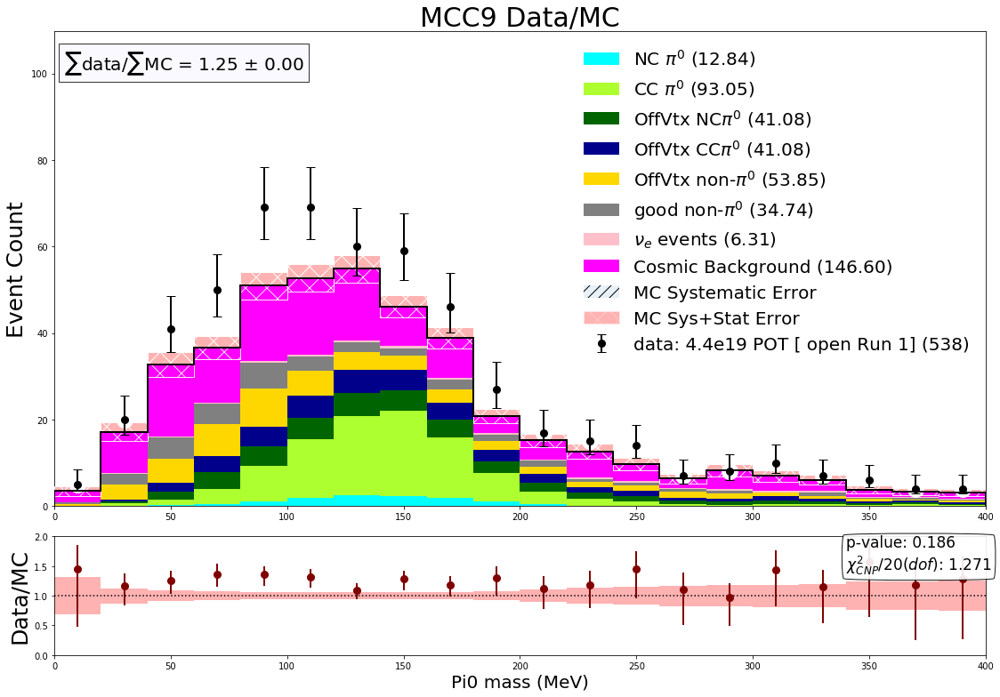

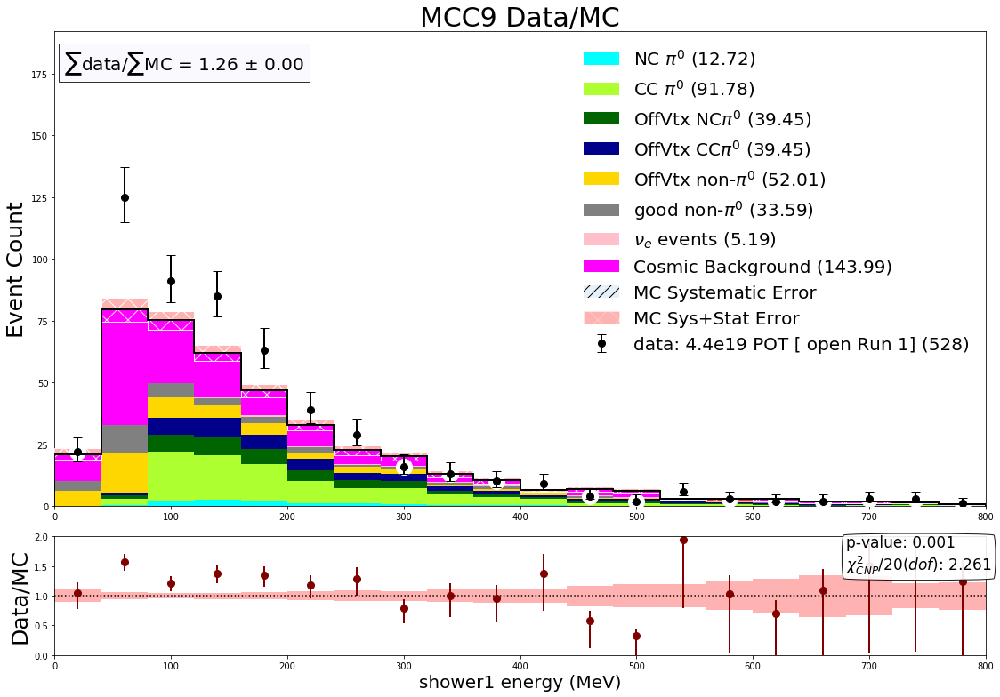

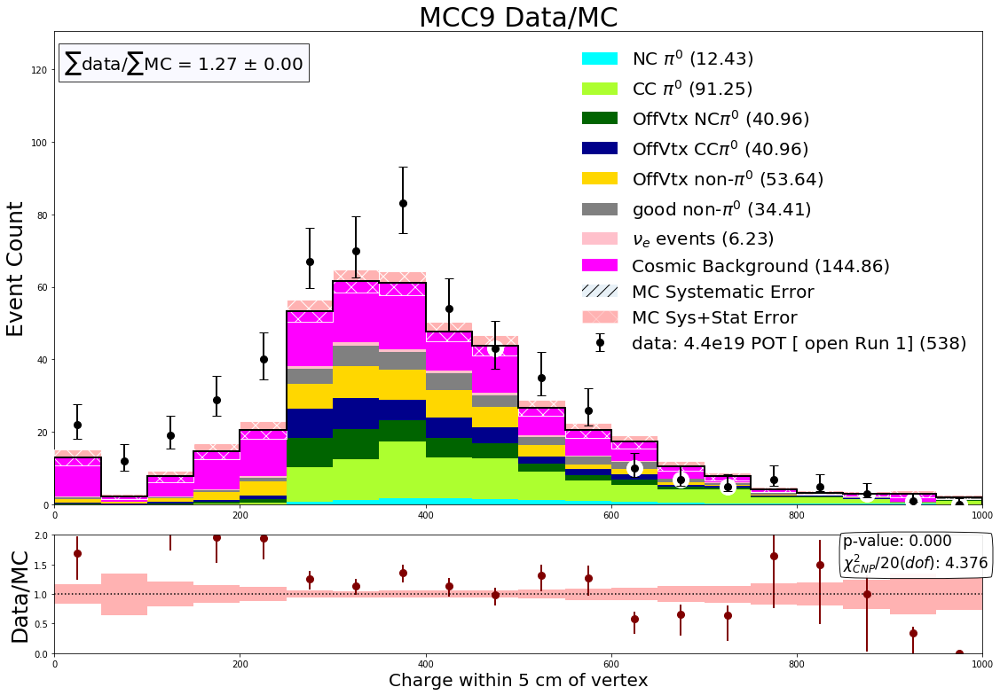

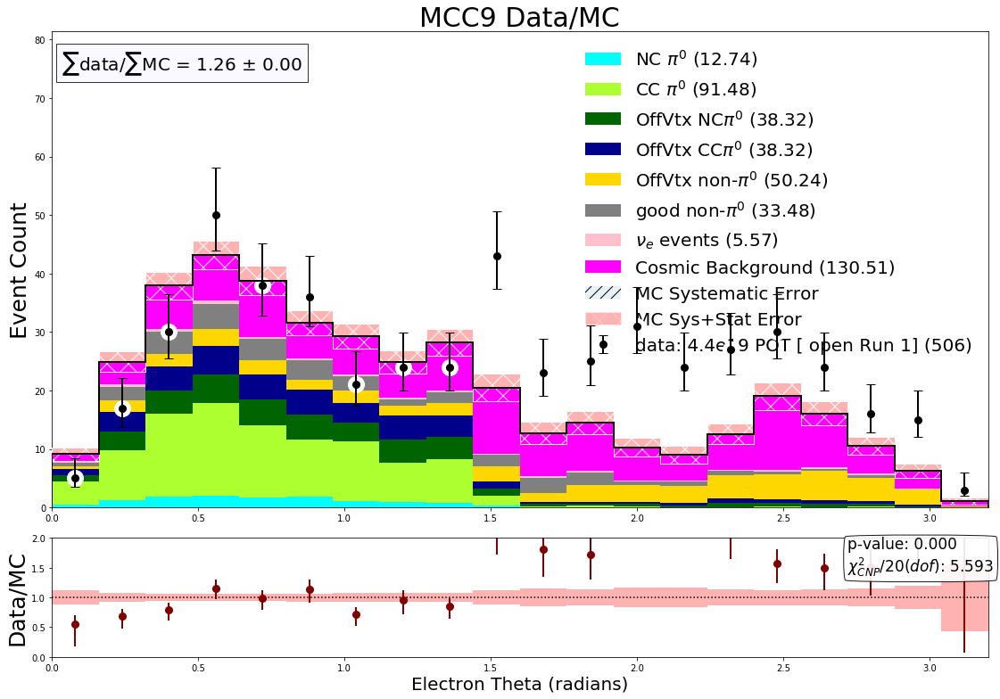

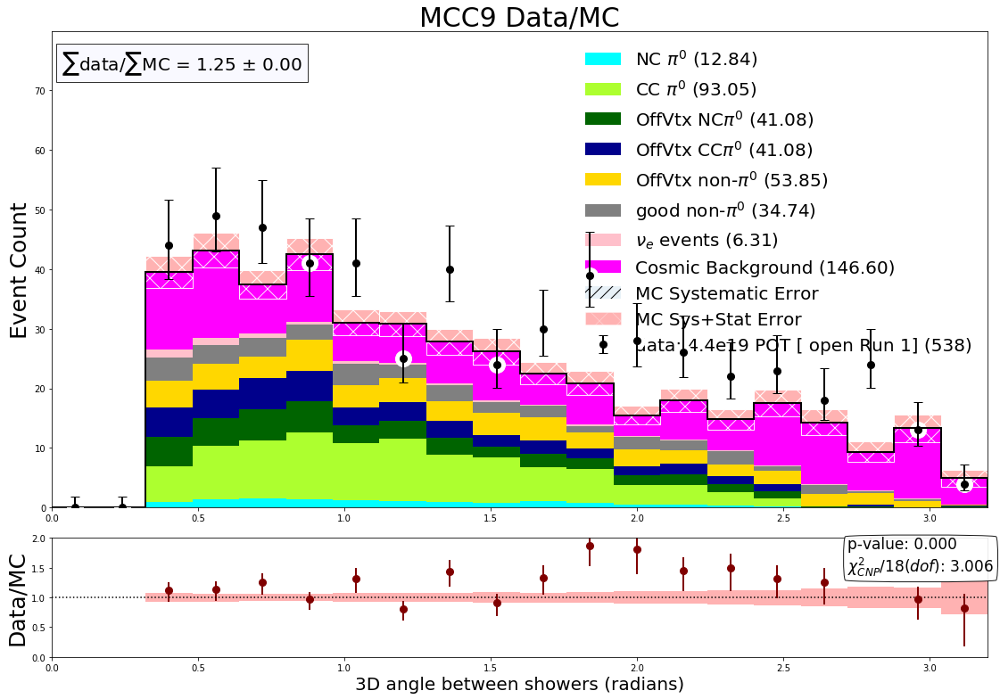

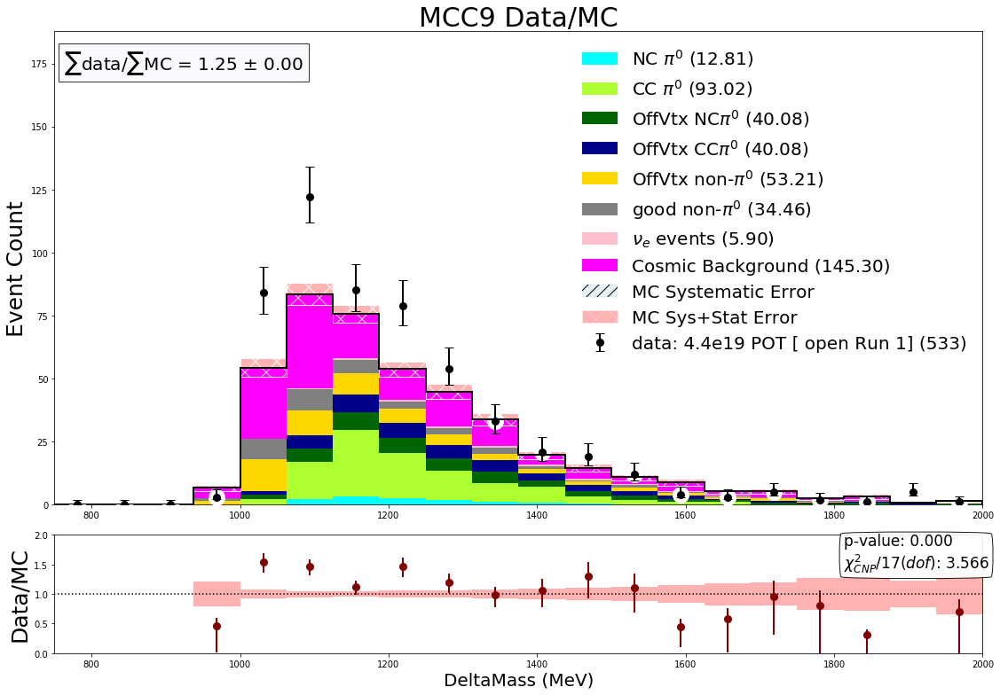

In [13]:
norm = 1.0
with PdfPages('output_preselection_201109.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        cov = np.zeros((nbins,nbins))
        
        run1_open_Hists = StackedHisto((df_bnb_ncpi0_pre,df_bnb_ccpi0_pre,df_bnb_ncpi0_offvtx_pre,df_bnb_ccpi0_offvtx_pre,df_bnb_other_offvtx_pre,df_bnb_other_good_pre,df_nue_pre),(NCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx CC$\pi^0$",'darkblue')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pre,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pre,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

In [14]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
# detvar_list.append('../systematics/detvar_pi0mass_cov.txt')
sys_list.append('none')
detvar_list.append('none')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000.0,1400.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(10)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,350.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.88918814 1.46763681 1.21217445 1.45902982 1.67732442
 1.62758579 1.29195929 1.4422029  0.77692377 0.99022822 0.60965958
 0.85925103 0.53916371 0.25821614 0.26189549 0.26953924 0.17371872
 0.1632009  0.09711819]
yerr_data 45.396262368276545
1.0683883236442373 0.3767695866370223


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide


hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         3.73253088 6.15365872 4.95989915 5.99680019 6.89906846
 6.68230529 5.15774887 5.93274655 3.07963975 4.11222566 2.51873773
 3.62057279 2.25179175 1.02383994 1.0384348  1.06708201 0.68874903
 0.64705087 0.38488874]
yerr_data 87.66606496295336
4.277204416518902 1.1236508390410904e-09


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         2.42806873 3.77488118 4.20613697 5.32752499 6.36699756
 5.22729909 5.45984698 4.5860794  3.89053414 2.13064946 2.33084763
 1.87202424 2.7587383  1.63582957 2.08153429 0.73717493 1.41924777
 1.44348171 0.5175524 ]
yerr_data 99.50022969443638
2.600066923246007 0.00016045335791170512
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.93934461 1.4186102  1.56695787 1.97914146 2.39134315
 1.82476866 1.94227502 1.61234848 1.44974977 0.74398143 0.86001514
 0.67023176 1.0729854  0.60475936 0.79296416 0.23399011 0.54687188
 0.55322558 0.16427871]
yerr_data 55.10447126987557
2.04394

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
Normalization Uncertainty: 0.0
yerr_mc_total [2.01545619 3.96828615 5.57567183 5.70067018 5.96462461 5.26993305
 4.884956   4.73330187 4.68074222 4.11194994]
yerr_data 81.79690112037561
3.9179461501687194 2.3615475203131453e-05
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
Normalization Uncertainty: 0.0
yerr_mc_total [0.77557491 1.47082896 2.04685003 2.05802815 2.17668586 1.88868375
 1.7813608  1.73962194 1.75287195 1.54156485]
yerr_data 45.55593078577284
2.7002048189200183 0.002602397916506738
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
Normalization Uncertainty: 0.0
yerr_mc_total [0.96306885 1.8

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
Normalization Uncertainty: 0.0
yerr_mc_total [2.7885057  6.22996255 6.17313527 6.16527868 5.30645998 4.0331865
 4.02533674 3.39695393 2.82087999 2.71447402 2.37030181 2.29878539
 1.32820112 2.06141446 1.9351587  0.8717464  0.74765136 0.57757813
 1.32654581 0.36098194]
yerr_data 101.26473611891952
2.398563505826144 0.0004293625215067154
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
Normalization Uncertainty: 0.0
yerr_mc_total [1.0352811  2.35469773 2.27710454 2.27495899 1.94892389 1.42246371
 1.45367029 1.20457068 0.99698341 0.96676445 0.870812   0.85127597
 0.42159047 0.7876509  0.75468896 0.27670507 0.23731548 0.18333175
 0.52289901 0.11458095]
yerr_data 55.604445990882965
2.49446

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
Normalization Uncertainty: 0.0
yerr_mc_total [6.08684805 6.59678271 6.11323674 4.25529566 4.28891125 3.83472601
 3.15838635 2.76696499 3.12514493 2.44412211 1.90415085 1.85812443
 1.10694251 1.93993754 0.91648484 0.752796   0.5237072  1.3099543
 0.42424499 0.35328325]
yerr_data 95.12015632643516
2.685219693532537 6.398238991600635e-05
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
Normalization Uncertainty: 0.0
yerr_mc_total [2.27480749 2.47280779 2.26076493 1.4862309  1.55886989 1.40078883
 1.09421096 0.98164275 1.16983264 0.89113469 0.67928891 0.66632333
 0.35135975 0.75592407 0.2909057  0.23894847 0.16623233 0.51866765
 0.13466157 0.11213727]
yerr_data 51.72372032347575
3.0867692

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
Normalization Uncertainty: 0.0
yerr_mc_total [4.87502889 6.07268301 5.39711166 4.84390939 5.17147591 4.1123352
 3.62708445 4.14234537 2.67640741 2.29715392 2.1917835  2.72196246
 1.40446736 1.46601127 1.77292756 2.10371378 1.68522902 1.01137396
 0.8333492  0.79788356]
yerr_data 104.51020411768349
2.7510889072215985 4.075485967203196e-05
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
Normalization Uncertainty: 0.0
yerr_mc_total [1.75138717 2.29205654 1.99804688 1.77003172 1.93699067 1.51017013
 1.3076614  1.54974196 0.95601146 0.79233056 0.76166388 1.01728204
 0.44579849 0.46533343 0.6425097  0.79883956 0.61827429 0.32102489
 0.26451723 0.25325992]
yerr_data 57.30365419259502
2.79195

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
Normalization Uncertainty: 0.0
yerr_mc_total [8.70966076e+00 8.15993082e+00 5.55111341e+00 6.22281525e+00
 4.47330375e+00 3.31653371e+00 4.54450087e+00 3.98033728e+00
 2.10963814e+00 1.51069416e+00 2.20378139e+00 2.13650107e+00
 2.12522945e+00 9.02817081e-01 3.84564535e-01 4.55446847e-01
 5.23506640e-01 3.70322624e-01 4.47411128e-01 5.03788668e-03]
yerr_data 80.16596163606907
6.235756021700223 0.0


/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
Normalization Uncertainty: 0.0
yerr_mc_total [7.41552717 6.16102284 5.55316976 4.66052464 4.07621849 3.54116918
 3.1991053  1.8695752  3.08215722 1.30559415 1.88429688 1.55993245
 0.85779959 1.43074206 1.53131125 1.34769312 0.44644346 1.37635589
 0.39199476 0.31573874]
yerr_data 93.60499283995627
1.6962601789912768 0.02663512824723957
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
Normalization Uncertainty: 0.0
yerr_mc_total [2.78411464 2.23112032 2.01698709 1.66287386 1.46788604 1.28371684
 1.14869794 0.59343053 1.15828492 0.41441469 0.67368782 0.58420592
 0.27227814 0.54988121 0.57652624 0.52831923 0.14170769 0.53571242
 0.12442487 0.1002201 ]
yerr_data 51.84209960539669
1.8487471

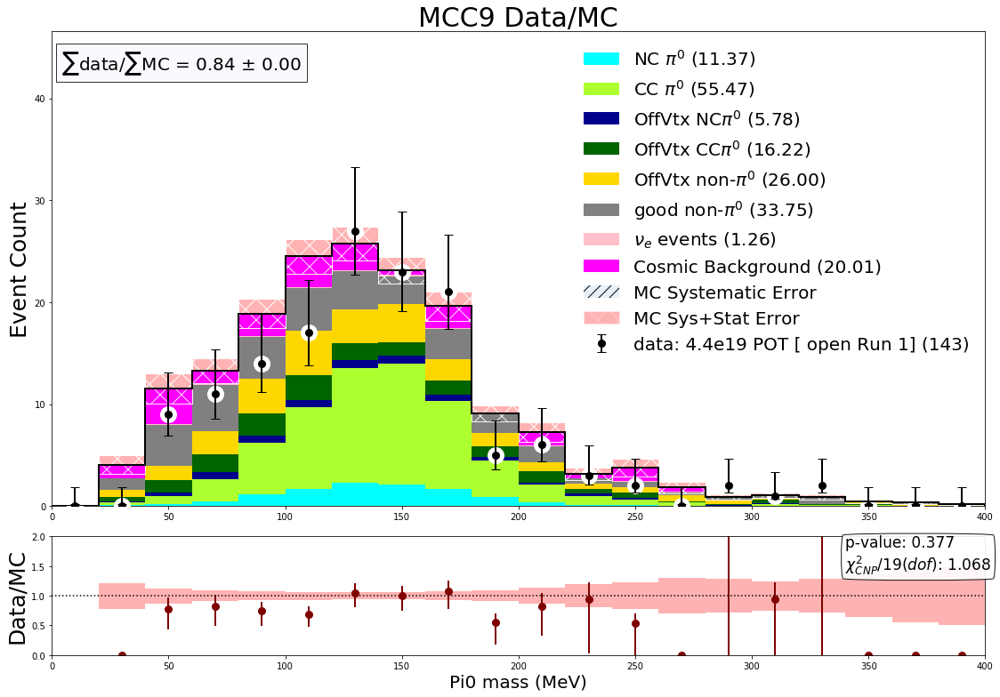

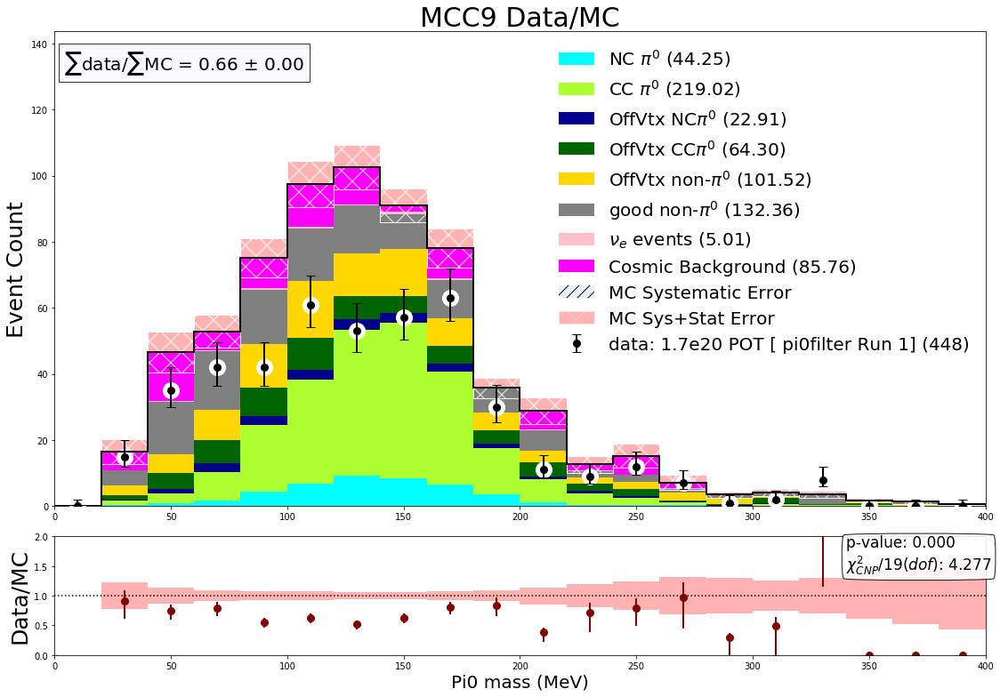

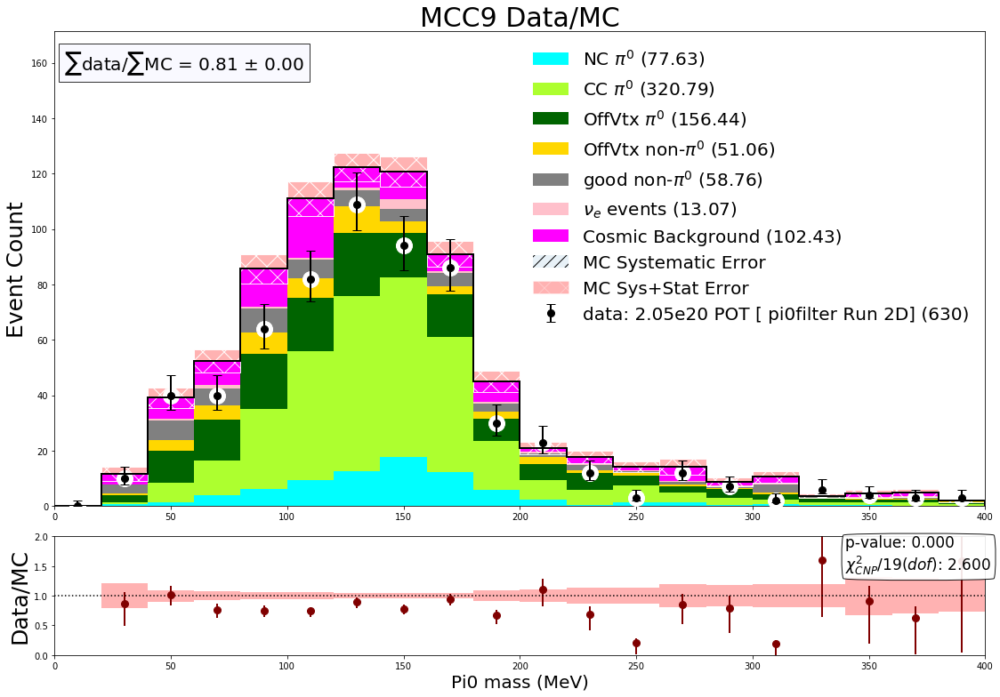

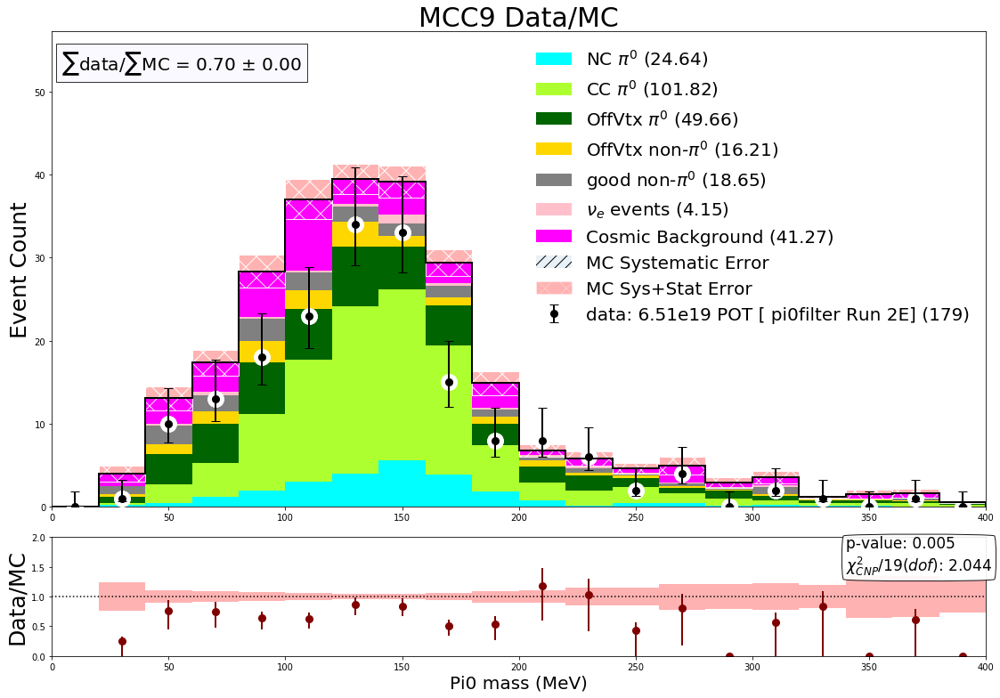

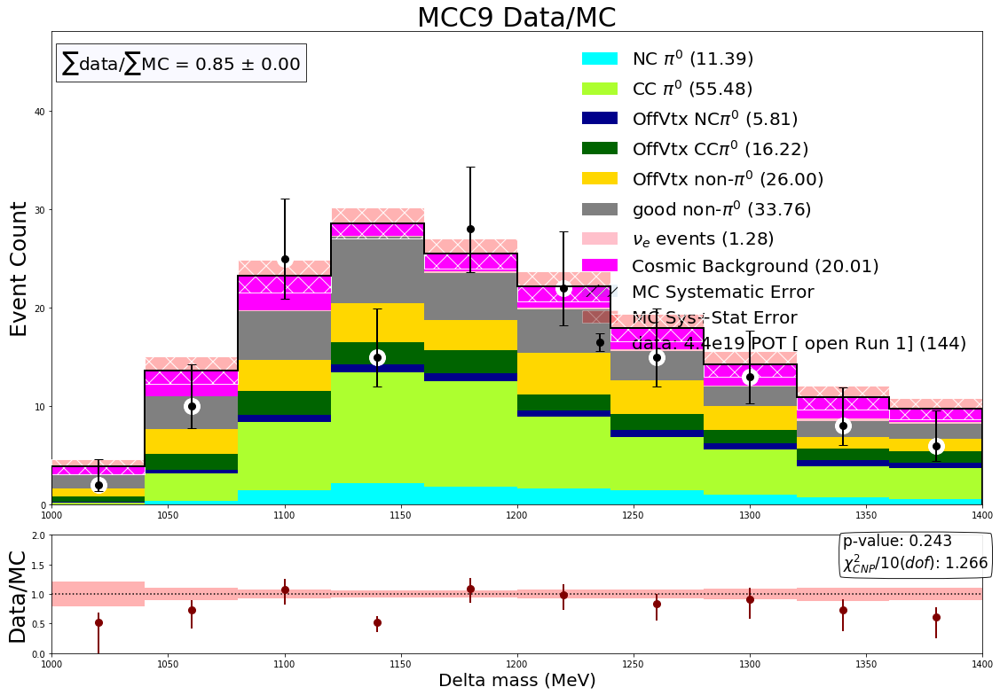

...

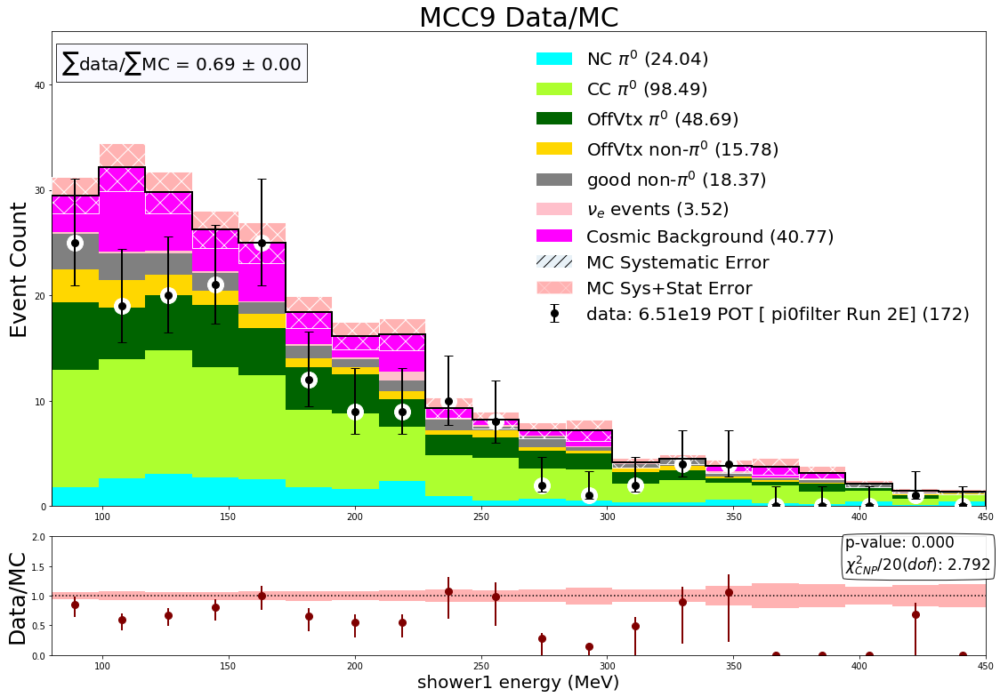

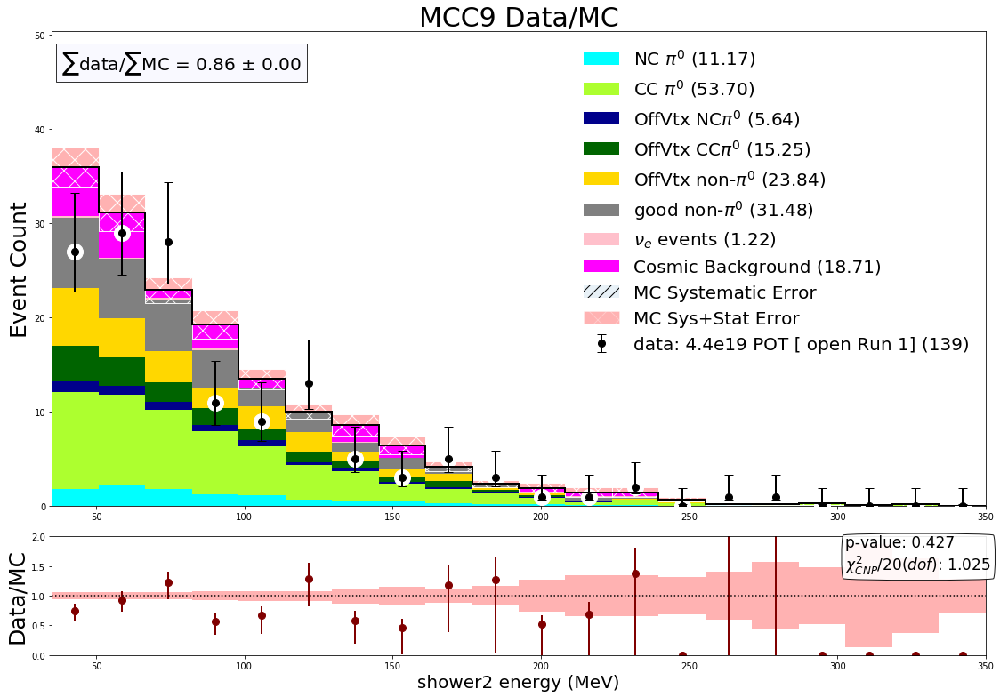

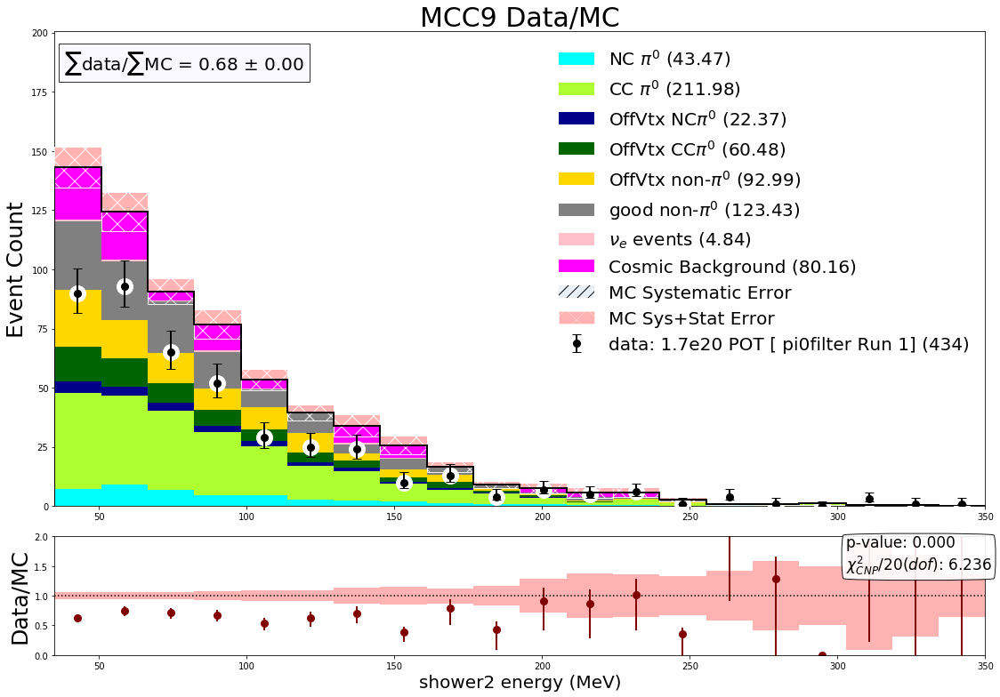

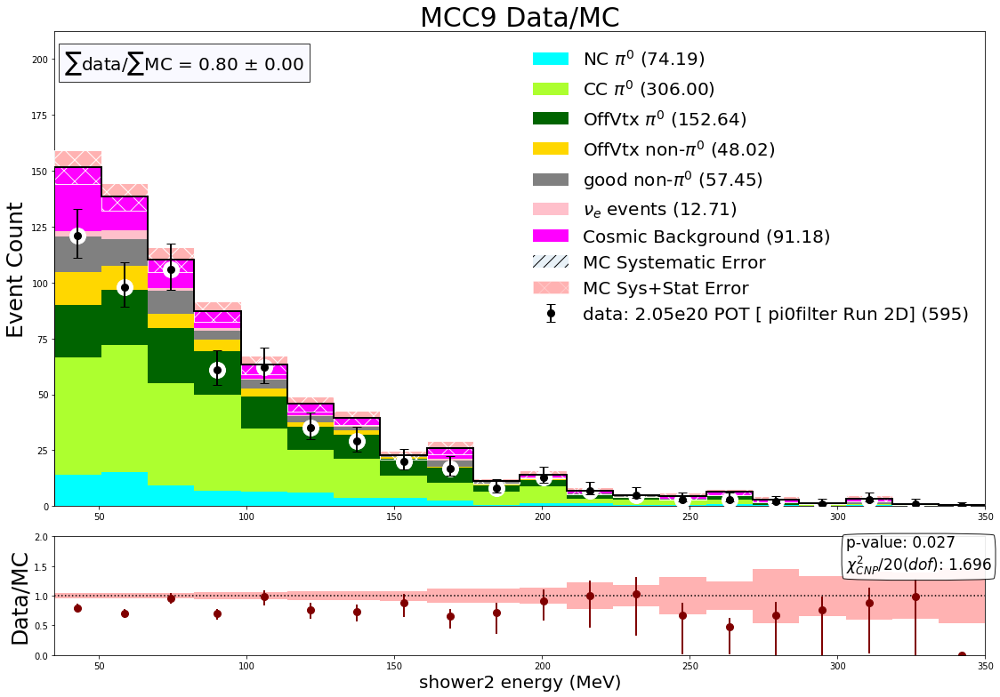

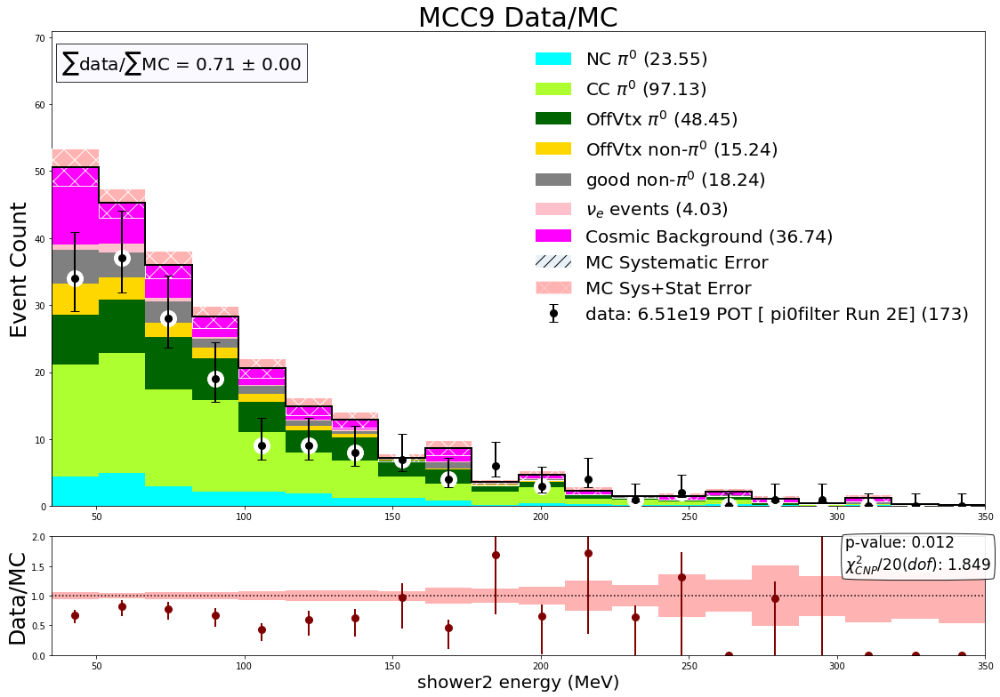

In [15]:
norm = 1.0
with PdfPages('output_201109.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        s_cov = np.zeros((nbins,nbins))
        if detvar_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov = np.genfromtxt(detvar_list[i],delimiter=',')
        
        cov = s_cov +d_cov
        run1_open_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5',r"OffVtx CC$\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pi0,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pi0,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
        run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5 ',r"OffVtx CC$\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        run2D_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUE_R2D_PI0FILTER_SCALE*norm))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2D_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2D_pi0filter_pi0,1.0,0,'','data: 2.05e20 POT [ pi0filter Run 2D]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)
        
        cov = np.zeros((nbins,nbins))
        run2E_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUE_R2E_PI0FILTER_SCALE*norm))
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2E_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2E_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2E_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2E_pi0filter_DataHist = SimpleHisto(df_data_r2E_pi0filter_pi0,1.0,0,'','data: 6.51e19 POT [ pi0filter Run 2E]')
        fig5,ax5,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2E_pi0filter_Hists,run2E_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3F_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUE_R3F_PI0FILTER_SCALE*norm))
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3F_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3F_pi0filter_DataHist = SimpleHisto(df_data_r3F_pi0filter_pi0,1.0,0,'','data: 4.3e19 POT [ pi0filter Run 3F]')
#         fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3G_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUE_R3G_PI0FILTER_SCALE*norm))
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3G_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3G_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3G_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3G_pi0filter_DataHist = SimpleHisto(df_data_r3G_pi0filter_pi0,1.0,0,'','data: 2e20 [ pi0filter Run 3G]')
#         fig7,ax7,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3G_pi0filter_Hists,run3G_pi0filter_DataHist,varname,m_cov=cov)
        
        #save to pdf file of plots
        pdf.savefig(fig1)
        pdf.savefig(fig3)
        pdf.savefig(fig4)
        pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

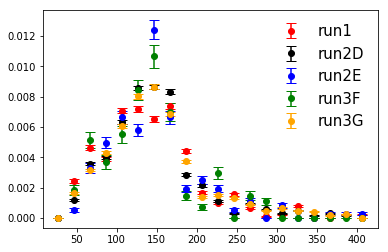

In [16]:
# Make data plots, normalized
# checking to see if any bins look realyl off
var_r1 = df_data_r1_pi0filter_pi0["_pi0mass_new"].values
var_r2D = df_data_r2D_pi0filter_pi0["_pi0mass_new"].values
var_r2E = df_data_r2E_pi0filter_pi0["_pi0mass_new"].values
var_r3F = df_data_r3F_pi0filter_pi0["_pi0mass_new"].values
var_r3G = df_data_r3G_pi0filter_pi0["_pi0mass_new"].values

# turn into histograms
r1_Hist,binedges = np.histogram( var_r1, bins = 20, range = [0,400],density = True)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)
    
r2D_Hist,_ = np.histogram( var_r2D, bins = 20, range = [0,400],density = True)
r2E_Hist,_ = np.histogram( var_r2E, bins = 20, range = [0,400],density = True)
r3F_Hist,_ = np.histogram( var_r3F, bins = 20, range = [0,400],density = True)
r3G_Hist,_ = np.histogram( var_r3G, bins = 20, range = [0,400],density = True)

err_1 = [sqrt(float(i))/float(len(var_r1)) for i in r1_Hist]
err_2d = [sqrt(float(i))/float(len(var_r2D)) for i in r2D_Hist]
err_2e = [sqrt(float(i))/float(len(var_r2E)) for i in r2E_Hist]
err_3f = [sqrt(float(i))/float(len(var_r3F)) for i in r3F_Hist]
err_3g = [sqrt(float(i))/float(len(var_r3G)) for i in r3G_Hist]


plt.errorbar(bincenters,r1_Hist, yerr=err_1,  fmt='o', color = 'red', ecolor='red', capsize=5,label = 'run1')
plt.errorbar(bincenters,r2D_Hist, yerr=err_2d,  fmt='o', color = 'black', ecolor='black', capsize=5,label = 'run2D')
plt.errorbar(bincenters,r2E_Hist, yerr=err_2e,  fmt='o', color = 'blue', ecolor='blue', capsize=5,label = 'run2E')
plt.errorbar(bincenters,r3F_Hist, yerr=err_3f,  fmt='o', color = 'green', ecolor='green', capsize=5,label = 'run3F')
plt.errorbar(bincenters,r3G_Hist, yerr=err_3g,  fmt='o', color = 'orange', ecolor='orange', capsize=5,label = 'run3G')

plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
plt.show()
plt.close()

# Make "DPF plots"

In [17]:
# # list of variables to plot:
# vars = ['Xreco','Yreco','Zreco','OpenAng','Thetas','Phis','ChargeNearTrunk','Enu_1e1p','PhiT_1e1p','AlphaT_1e1p','PT_1e1p','PTRat_1e1p','BjXB_1e1p','BjYB_1e1p','Q2_1e1p','SphB_1e1p','Q0_1e1p','Q3_1e1p','Lepton_PhiReco','Lepton_ThetaReco','Lepton_TrackLength','Muon_Edep','Proton_PhiReco','Proton_ThetaReco','Proton_TrackLength','Proton_Edep','Proton_CosTheta','Lepton_CosTheta']
# # list of ranges
# ranges = [(15,241.25),(-101.5,101.),(15,1021.8),(.6,2.8),(0,6.3),(1.5,4),(0,600),(200,1200),(0,1),(0,np.pi),(0,320),(0,1),(0,1.8),(0.05,.75),(0,6e5),(0,1200),(70,600),(200,1000),(-np.pi,np.pi),(.2,2.8),(20,200),(50,600),(-np.pi,np.pi),(0,2),(5,100),(50,500),(-1,1),(-1,1),]
# print(vars)
# print(ranges)
# nbins =20

# for i in range(len(vars)):
#     vartest = vars[i]
#     varname = vars[i]
#     myrange = ranges[i]
#     norm = len(df_data_r1_pi0filter_pi0)/(len(df_numu_pi0)*NUMU_R1_PI0FILTER_SCALE+ len(df_nue_pi0)*NUE_R1_PI0FILTER_SCALE +len(df_ext_pi0)*EXT_R1_PI0FILTER_SCALE)
#     print("Norm", norm)
#     run1Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_pi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
#     run1Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#     run1Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#     run1Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#     run1Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#     run1Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#     run1DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [Run 1]')
#     cov = np.zeros((nbins,nbins))
#     fig,ax0,_ ,a= distplot_wratio_davio(vartest,nbins,myrange,run1Hists,run1DataHist,varname,m_cov=cov)

# Start of combined plots...

In [18]:
# add all of the data frames
# df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r2D_pi0filter_pi0)
df_data_total_2 = df_data_total_1.append(df_data_r2E_pi0filter_pi0)
df_data_total_3 = df_data_total_2.append(df_data_r3F_pi0filter_pi0)
df_data_total = df_data_total_3.append(df_data_r3G_pi0filter_pi0)

print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# scale CV weights:
def potscale(df,scalefactor=1.0,ext=False):
    pot_weight = []
    for i in range(len(df)):
        if ext==False:
            pot_weight.append(scalefactor)
        else:
            pot_weight.append(scalefactor)
    return pot_weight

# general mc
w_mu_1 =potscale(df_numu_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_POT)
w_mu_1_1mil =potscale(df_numu_1mil_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_1MIL_POT)
w_mu_2 =potscale(df_numu_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
w_mu_2_1mil =potscale(df_numu_r2_1mil_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_1MIL_POT)
w_mu_3 =potscale(df_numu_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUMU_R3_POT)
df_numu_pi0['pot_weight'] = w_mu_1
df_numu_1mil_pi0['pot_weight'] = w_mu_1_1mil
df_numu_r2_pi0['pot_weight'] = w_mu_2
df_numu_r2_1mil_pi0['pot_weight'] = w_mu_2_1mil
df_numu_r3_pi0['pot_weight'] = w_mu_3

# df_numu_total_1 = df_numu_pi0.append(df_numu_r2_pi0)
df_numu_total_1 = df_numu_1mil_pi0.append(df_numu_r2_1mil_pi0)
df_numu_total = df_numu_total_1.append(df_numu_r3_pi0)

w_e_1 =potscale(df_nue_pi0,DATA_R1_PI0FILTER_POT/NUE_R1_POT)
w_e_2 =potscale(df_nue_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUE_R2_POT)
w_e_3 =potscale(df_nue_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUE_R3_POT)
df_nue_pi0['pot_weight'] = w_e_1
df_nue_r2_pi0['pot_weight'] = w_e_2
df_nue_r3_pi0['pot_weight'] = w_e_3
df_nue_total_1 = df_nue_pi0.append(df_nue_r2_pi0)
df_nue_total = df_nue_total_1.append(df_nue_r3_pi0)

df_ext_r3_2_pi0 = df_ext_r3_pi0
df_ext_r3_3_pi0 = df_ext_r3_pi0
w_ext_1 =potscale(df_ext_pi0,DATA_R1_PI0FILTER_POT/EXT_R1_PI0FILTER_POT,True)
w_ext_2 =potscale(df_ext_r3_2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT),True)
w_ext_3 =potscale(df_ext_r3_3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/(EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT),True)
df_ext_pi0['pot_weight'] = w_ext_1
df_ext_r3_2_pi0['pot_weight'] = w_ext_2
df_ext_r3_2_pi0['pot_weight'] = w_ext_3
df_ext_total_1 = df_ext_pi0.append(df_ext_r3_2_pi0)
df_ext_total = df_ext_total_1.append(df_ext_r3_3_pi0)

# df_bnb_ncpi0_r2 = df_numu_r2_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 and MC_parentPDG ==14')
# df_bnb_ccpi0_r2 = df_numu_r2_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5 and MC_parentPDG ==14")

# df_bnb_offvtx_pi0_r2 = df_numu_r2_pi0.query("haspi0==1 and  MC_scedr>=5 and MC_parentPDG ==14")
# w_off_2 =potscale(df_bnb_offvtx_pi0_r2,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
# df_bnb_offvtx_pi0_r2['pot_weight'] = w_off_2

w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
w_cc_2 =potscale(df_ccpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(CCPI0_R3_POT))
df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
df_ccpi0_r2_pi0 = df_ccpi0_r3_pi0
df_ccpi0_r2_pi0['pot_weight'] = w_cc_2
df_ccpi0_total1 = df_ccpi0_r1_pi0.append(df_ccpi0_r2_pi0)
df_ccpi0_total = df_ccpi0_total1.append(df_ccpi0_r3_pi0)

w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
w_nc_2 =potscale(df_ncpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
df_ncpi0_r2_pi0 = df_ncpi0_r3_pi0
df_ncpi0_r2_pi0['pot_weight'] = w_nc_2
df_ncpi0_total1 = df_ncpi0_r1_pi0.append(df_ncpi0_r2_pi0)
df_ncpi0_total = df_ncpi0_total1.append(df_ncpi0_r3_pi0)

n=float(len(df_numu_total.query('newhaspi0==1') ))
print(sqrt(n)/n)
a = float(len(df_ncpi0_total)+len(df_ccpi0_total))
print(sqrt(a))
print(abs((234+1028+462)-(242+1039+472))/(234+1028+462))
                 
# tot1 = 0
# for i in range(len(df_numu_total)):
#     tot1+=df_numu_total['pot_weight'].values[i]*df_numu_total['xsec_corr_weight'].values[i]
# tot2 = 0
# for i in range(len(df_nue_total)):
#     tot2+=df_nue_total['pot_weight'].values[i]*df_nue_total['xsec_corr_weight'].values[i]
# print(tot1+tot2)
# tot3 = 0
# for i in range(len(df_ext_total)):
#     tot3+=df_ext_total['pot_weight'].values[i]
# print(tot3)


# # #specific categories
# df_bnb_ncpi0_total = df_numu_total.query('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ')
# tot4 = 0
# for i in range(len(df_bnb_ncpi0_total)):
#     tot4+=df_bnb_ncpi0_total['pot_weight'].values[i]*df_bnb_ncpi0_total['xsec_corr_weight'].values[i]
# print(tot4)
                 
# df_bnb_ccpi0_total = df_ccpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ncpi0_total = df_ncpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ccpi0_offvtx_total = df_ccpi0_total.query("MC_scedr>=5 ") 
# df_bnb_ncpi0_offvtx_total = df_ncpi0_total.query("MC_scedr>=5 ") 
# df_bnb_other_offvtx_total = df_numu_total.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_total = df_numu_total.query("haspi0==0 and MC_scedr<5")



# print(df_numu_pi0['xsec_corr_weight'].values)

total number of data pi0:  2016


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


0.011177545850247397
81.39410298049853
0.016821345707656612


In [40]:
NUMU_POT_TOTAL = NUMU_R1_1MIL_POT+NUMU_R2_1MIL_POT+NUMU_R3_POT
NUE_POT_TOTAL = NUE_R1_POT+NUE_R2_POT+NUE_R3_POT
EXT_POT_TOTAL = EXT_R1_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT
CCPI0_POT_TOTAL = CCPI0_R1_POT+CCPI0_R3_POT
NCPI0_POT_TOTAL = NCPI0_R1_POT+NCPI0_R3a_POT+NCPI0_R3b_POT

# DATA_POT_TOTAL = FAKE_DATA_1_RUN1_POT + FAKE_DATA_1_RUN3_POT
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+ DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT+ DATA_R3F_PI0FILTER_POT+ DATA_R3G_PI0FILTER_POT
DATA_R2_POT_TOTAL = DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT
print("pot total:",DATA_POT_TOTAL)
POT_SCALE_FACTOR = DATA_POT_TOTAL
NUMU_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUMU_POT_TOTAL)
NUE_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUE_POT_TOTAL)
CCPI0_SCALE_TOTAL =POT_SCALE_FACTOR / float(CCPI0_POT_TOTAL)
NCPI0_SCALE_TOTAL = POT_SCALE_FACTOR / float(NCPI0_POT_TOTAL)
EXT_SCALE_TOTAL = POT_SCALE_FACTOR / float(EXT_POT_TOTAL)
DATA_SCALE_TOTAL = POT_SCALE_FACTOR / float(DATA_POT_TOTAL)
print(CCPI0_SCALE_TOTAL)

# make some lists of bin values:
numu_test=df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
var_numu=numu_test['_pi0mass_new'].values
weights_numu =[numu_test['pot_weight'].values[i]*numu_test['xsec_corr_weight'].values[i] for i in range(len(var_numu))]
numu_Hist,_ = np.histogram( var_numu, bins = 20, range = [30,300],weights=weights_numu)

nue_test=df_nue_total.query('MC_parentPDG ==12')
var_nue=nue_test['_pi0mass_new'].values
weights_nue =[nue_test['pot_weight'].values[i]*nue_test['xsec_corr_weight'].values[i] for i in range(len(var_nue))]
nue_Hist,_ = np.histogram( var_nue, bins = 20, range = [30,300],weights=weights_nue)

ccpi0_test=df_ccpi0_total
var_ccpi0=ccpi0_test['_pi0mass_new'].values
weights_ccpi0 =[ccpi0_test['pot_weight'].values[i]*ccpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ccpi0))]
ccpi0_Hist,_ = np.histogram( var_ccpi0, bins = 20, range = [30,300],weights=weights_ccpi0)

ncpi0_test=df_ncpi0_total
var_ncpi0=ncpi0_test['_pi0mass_new'].values
weights_ncpi0 =[ncpi0_test['pot_weight'].values[i]*ncpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ncpi0))]
ncpi0_Hist,_ = np.histogram( var_ncpi0, bins = 20, range = [30,300],weights=weights_ncpi0)

ext_test=df_ext_total
var_ext=ext_test['_pi0mass_new'].values
weights_ext =[ext_test['pot_weight'].values[i] for i in range(len(var_ext))]
ext_Hist,_ = np.histogram( var_ext, bins = 20, range = [30,300],weights=weights_ext)

data_test=df_data_total
var_data=data_test['_pi0mass_new'].values
data_Hist,_ = np.histogram( var_data, bins = 20, range = [30,300])

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

errdatalow=[]
errdatahigh=[]

for i in range(20):
    elow,ehigh=GetErrorsData(data_Hist[i])
    errdatalow.append(data_Hist[i] -elow)
    errdatahigh.append(ehigh-data_Hist[i])

numu = []
ext = []
total = []

for i in range(20):
    numu.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i])
    ext.append(ext_Hist[i])
    total.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i]+ext_Hist[i])
    
print(numu,sum(numu))
print(ext,sum(ext))
print(total,sum(total))
print(data_Hist,sum(data_Hist))
print(errdatalow)
print(errdatahigh)

pot total: 6.8767e+20
0.5340889762550319
[47.117627448234586, 70.33873243614818, 97.63130750879412, 140.73932352853038, 170.88819438274447, 236.6686027974058, 246.10844757434342, 260.2470159715978, 256.70775776976325, 182.58945959384718, 95.72462997887123, 56.09886196174314, 47.130430195730824, 33.13246481561536, 24.365081153458775, 19.273660080235395, 11.609852448779272, 13.119085674046291, 10.70942173832437, 18.61509556203697] 2038.815052620251
[13.840030449156185, 17.568513285000126, 13.57155522560129, 24.741918586170843, 18.62732903225742, 28.470401422014792, 15.972747090633046, 13.034604778491506, 9.574597166202462, 12.512739478344, 7.978830971835386, 3.4600076122890466, 5.324249030211016, 5.0557738066561235, 7.188490448132985, 1.5957661943670773, 6.6515400010232, 1.5957661943670773, 1.5957661943670773, 1.5957661943670773] 209.95639316148777
[60.957657897390774, 87.9072457211483, 111.20286273439541, 165.48124211470122, 189.5155234150019, 265.1390042194206, 262.08119466497646, 273.

In [20]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar1_list  = []
detvar3_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass_new')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((30.0,350.0))
sys_list.append('../systematics/covar_cv_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000,1400))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__Delta_mass_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,750.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_energy_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,700.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_momentum_reco.txt')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower1_energy_reco.txt')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,300.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower2_energy_reco.txt')
bins_list.append(20)


vartest_list.append('MPID_muon')
varname_list.append('MPID muon score')
myrange_list.append((0,1))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__mpid_muon_score.txt')
bins_list.append(20)

vartest_list.append('Enu_1e1p')
varname_list.append('Reco Neutrino Energy (MeV)')
myrange_list.append((0,1200))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)


vartest_list.append('Proton_Edep')
varname_list.append('Reco Proton Energy (MeV)')
myrange_list.append((0,450))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
Normalization Uncertainty: 0.0
yerr_mc_total [5.45043348 6.30662773 6.74379051 8.40767818 8.88117952 9.33134428
 8.45734184 7.91838467 7.48315623 4.5909568  5.4385621  3.02162881
 4.32653779 2.29823753 2.52751621 1.88890727 1.99840977 1.12800456
 1.423178   0.69225358]
yerr_data 87.00490359257526
1.8590261469290916 0.01113213610144348


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [ 5.71158208  6.75424108  8.67765221  9.8113103  10.80905178 11.69138766
 11.37492593 10.88387143  8.49816069  5.78893918  4.58490117  4.31895165
  4.02156743  3.4755698   3.52098726  2.8400524   3.02938466  2.14333611
  1.81129697  2.2097808 ]
yerr_data 116.9783686193736
1.264837571527944 0.1903130606554112
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.84988078  6.41043974  7.87487101  8.5712099  10.32181398 10.65771917
 11.23076406 10.14783499  8.06360854  5.4171959   4.62063764  3.82461857
  3.03862735  3.0569459   2.39277294  2.21760431  2.77000816  1.98001111
  1.71013759  1.95112902]
yerr_

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [1.19900066 2.86497713 4.44474667 6.24852737 7.58948121 8.29352116
 8.71109205 8.76420072 9.18342694 8.37862143 8.75668109 8.01349361
 7.54470368 6.90466714 7.05707191 6.49926209 6.61573532 5.85160381
 5.45555616 5.42577586]
yerr_data 129.6442808401383
1.3617922425593059 0.12875812722564872
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [1.39210252 2.80768992 4.39250318 5.50163514 6.66100322 7.9482412
 7.69514841 8.78700328 8.22258535 7.88925616 7.64657986 7.64307427
 6.77138563 6.63063173 6.92004966 6.15475886 5.56855342 5.67960394
 5.03718564 4.82282779]
yerr_data 122.33934577204141
0.7123671932809

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.66187439 10.12458468 11.69526371 12.07635801 10.69962057 10.04670386
  8.35751469  7.85945174  7.31792124  6.27768091  5.89630539  4.51266177
  4.31373999  3.79203612  3.34020553  2.78107766  2.44647411  2.17639664
  1.79186652  1.65748064]
yerr_data 116.22804104458682
1.7276115148604028 0.022622926038373237
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.14750903  9.05971241 10.84941378 10.44596896 10.33997047  9.89608179
  8.22885356  7.19555702  6.4800267   6.27738811  5.20367848  4.26712699
  3.67531095  2.91606323  2.93023239  2.9644542   2.10210571  2.08938314
  2.01303853  1.25137531]
y

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [10.36023509 11.057055   11.27236095 10.17400968  9.26248236  8.31655445
  7.36487775  7.28181184  6.23203207  5.66436891  5.32785822  4.42094168
  3.97339294  3.95986388  3.12770057  2.52682093  2.24734013  2.29732807
  2.07988867  1.53581344]
yerr_data 112.78810401949336
1.4114496951606124 0.10408846824291196
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.48589745 10.06978653 10.02697734  9.42208003  8.94811139  8.21606053
  7.15080819  6.73624105  5.97147615  5.28290205  4.85596898  4.18430921
  3.16635563  3.22255864  2.93262759  2.49260863  2.28821806  1.90385423
  1.8693461   1.954717  ]
ye

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [10.66296045 10.65985287 10.61492414  9.95896016  9.59641199  8.3435745
  7.88092353  7.6774795   6.33895655  5.71385277  5.35885366  5.178131
  4.13323692  4.30669609  3.8071765   3.61609425  3.45193827  2.98757518
  2.8454854   2.35928393]
yerr_data 117.50916181273836
1.7874887301258457 0.016455860748154416
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.21218471 10.1765018  10.02451692  9.06519037  8.4632435   8.05640985
  7.33755709  6.92385857  6.15817381  6.1060449   5.03768155  5.07192578
  3.64825216  3.74725091  3.55724475  3.17368797  2.75840724  2.73237856
  2.04112699  2.18308476]
yerr

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [12.27231997 12.50332029 11.32097754 10.05065574  9.38243393  8.3279734
  6.98638314  6.64145591  5.4683284   5.41445235  4.27490638  3.83599647
  3.73336948  2.84035278  2.5046624   2.16531903  1.90882695  2.50274636
  1.62960558  1.31258973]
yerr_data 110.9995302701219
1.0930799320722306 0.34806767418001705
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [11.44433157 10.99953815 10.34156088  8.98846616  8.59930159  8.06010118
  7.28593727  6.32206967  5.54617032  4.90257696  4.25681266  3.72275509
  3.24339335  3.12695361  1.86367209  2.01002812  1.99745939  1.9118807
  1.47754548  1.23514237]
yerr_

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [ 7.67701074  6.55609407  5.86425209  5.85084997  5.10233839  5.62181161
  5.98492     5.1950855   5.57211363  5.46772041  5.67107988  5.74762538
  6.44631974  6.72395893  6.87354597  7.11689276  8.30454061  9.6051716
 10.34607774 10.41362288]
yerr_data 131.52301556272226
1.2932735272478983 0.17030109463270648
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [7.08240459 5.63216206 5.39263255 5.62274277 5.74463606 5.46146078
 5.67442371 5.54648882 5.6735557  5.03253212 4.90463973 5.48693479
 5.87929152 5.43228008 6.03636824 6.29942263 7.56684973 8.90745497
 9.69712129 9.37939235]
yerr_data 123.451899952

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          5.82714775 11.18004802 11.4479434
 10.09649066  8.45988701  7.13328511  5.29914474  5.70751576  5.27234912
  2.73254725  4.10967451  2.5761351   2.95772866  2.27883039  1.02506519
  1.00375151  0.85211936]
yerr_data 77.3808549447467
1.3754461572353178 0.13720487286128646


/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          8.08820755 13.32086726 13.99664609
 13.08459862 10.6165979   8.94987216  7.44003159  5.80670322  4.94124488
  4.08530318  2.80719989  3.33614209  2.98700371  2.37870398  1.96270265
  1.52136877  0.76135279]
yerr_data 102.30397494483545
1.5511863870005218 0.06797534418140838
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          7.03105144 12.57094612 12.93644907
 12.14059858  9.95048029  8.26336095  6.65945022  5.77870097  4.64010113
  3.66594029  2.78464256  3.13599512  2.12043035  2.04102084  2.02122526
  1.22022556  1.11822739]
ye

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          5.83180042 12.02726824 11.80465459 10.97151355
 10.25353516  8.77519326  8.16000396  7.94014436  6.72160504  5.77302983
  5.81716003  4.80195222  3.9292851   3.63333943  3.506304    3.29752451
  2.43439386  2.47716631]
yerr_data 113.72851827785122
1.525279098807823 0.07084756551158078
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          5.9497351  11.26327003 10.79042071  9.84080114
  9.55631958  8.63298396  7.83796697  7.06909667  6.35257048  5.39433747
  4.4523423   4.39697504  3.62626875  3.70270752  2.6183608   3.04304912
  1.94609486  2.15212169]
yer

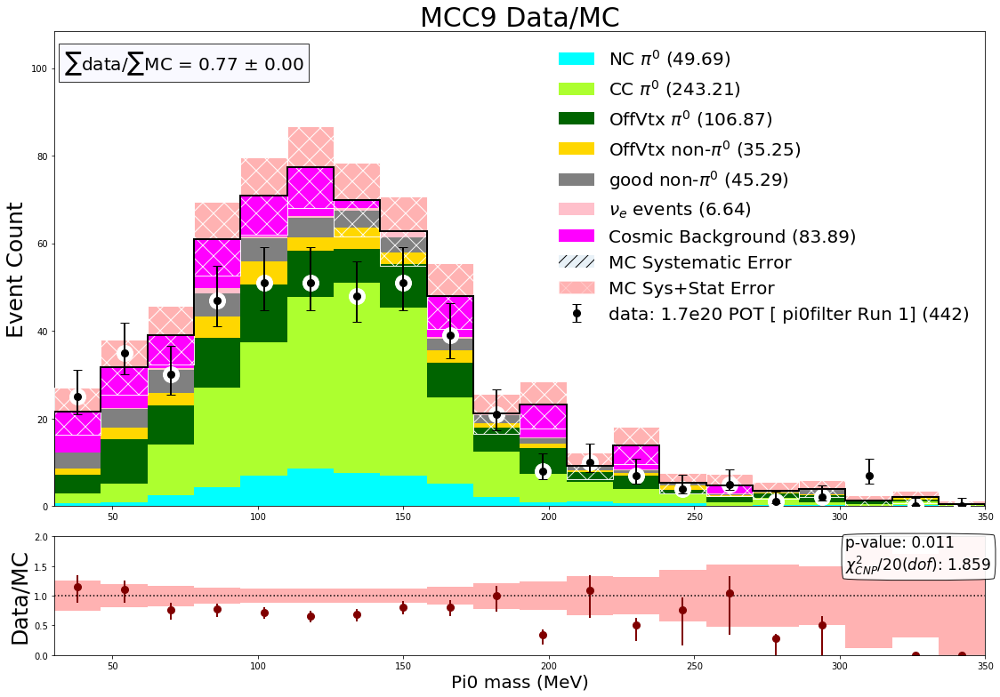

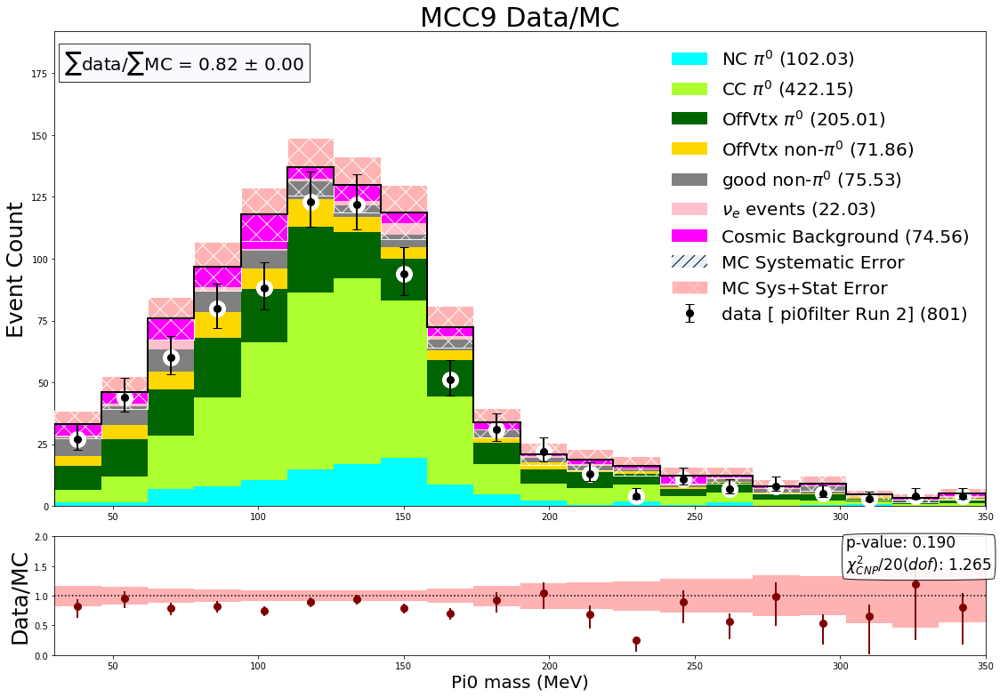

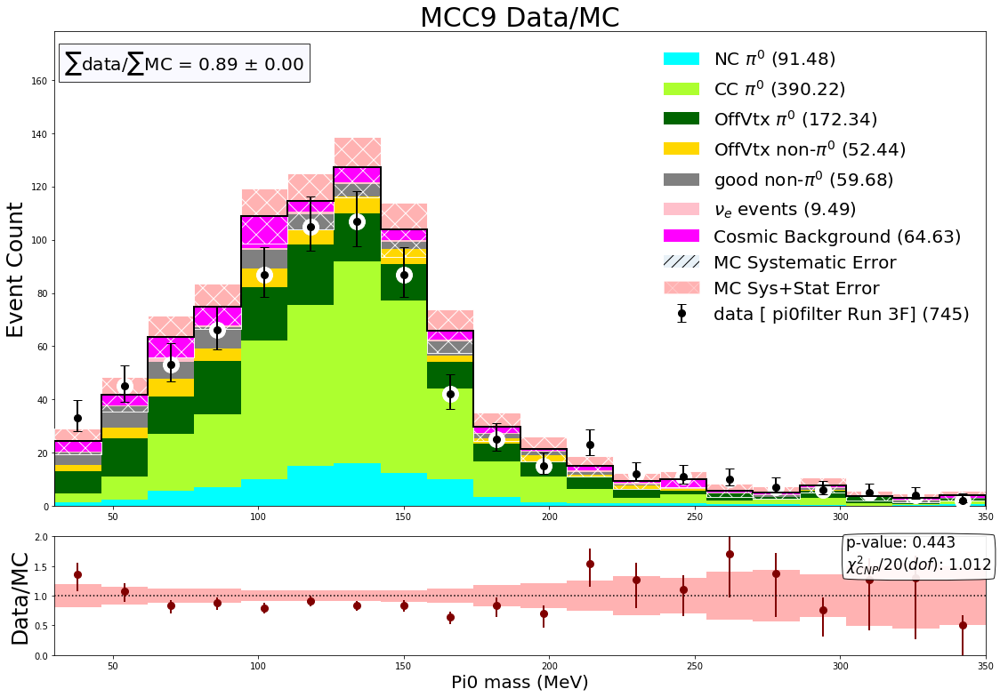

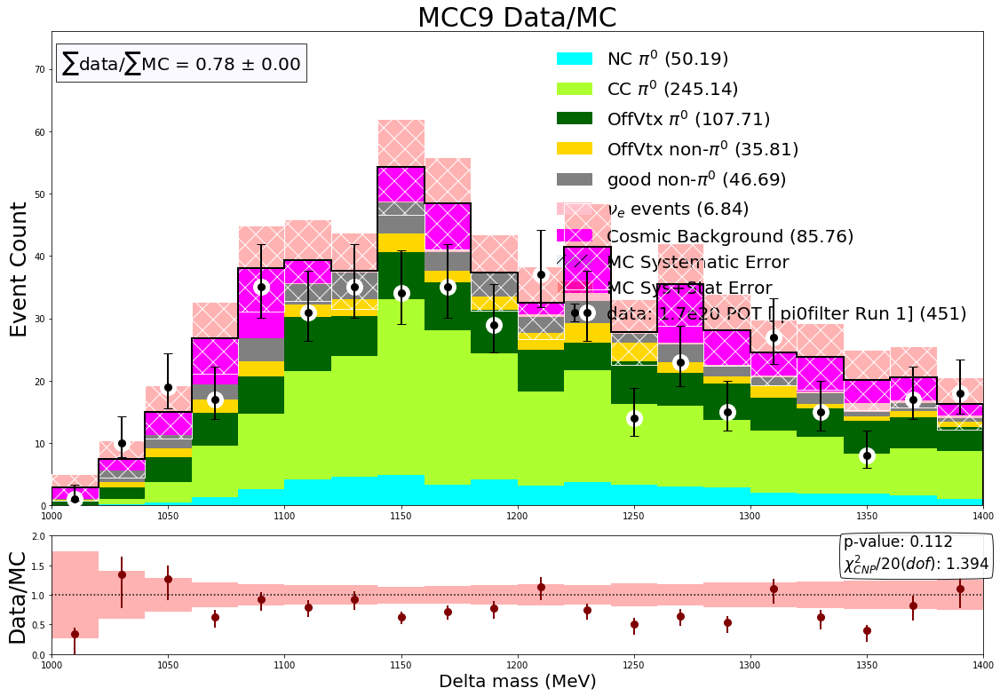

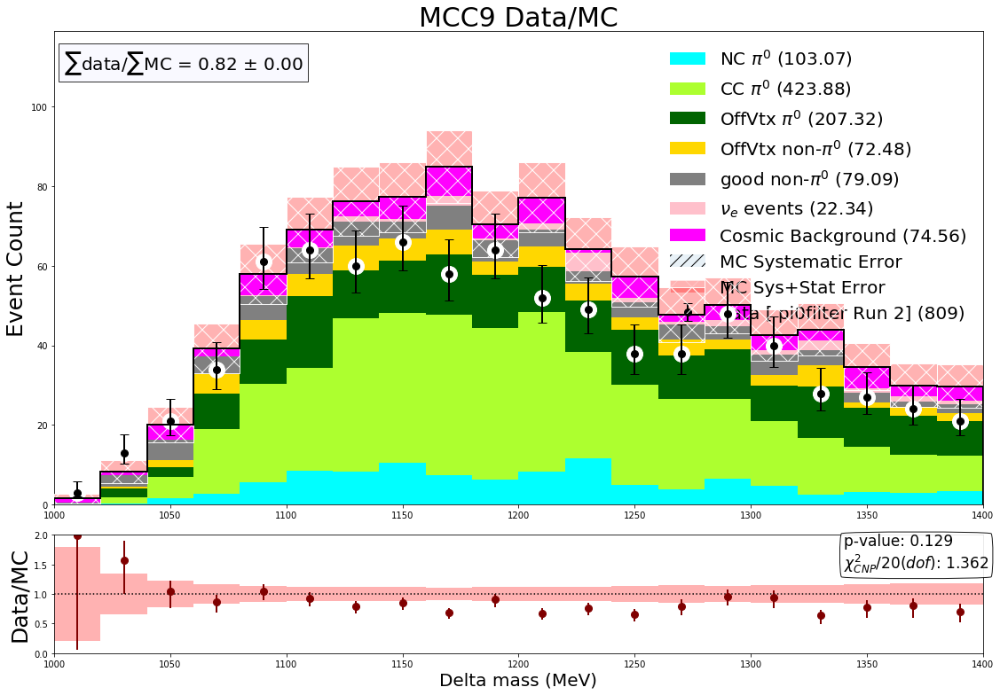

...

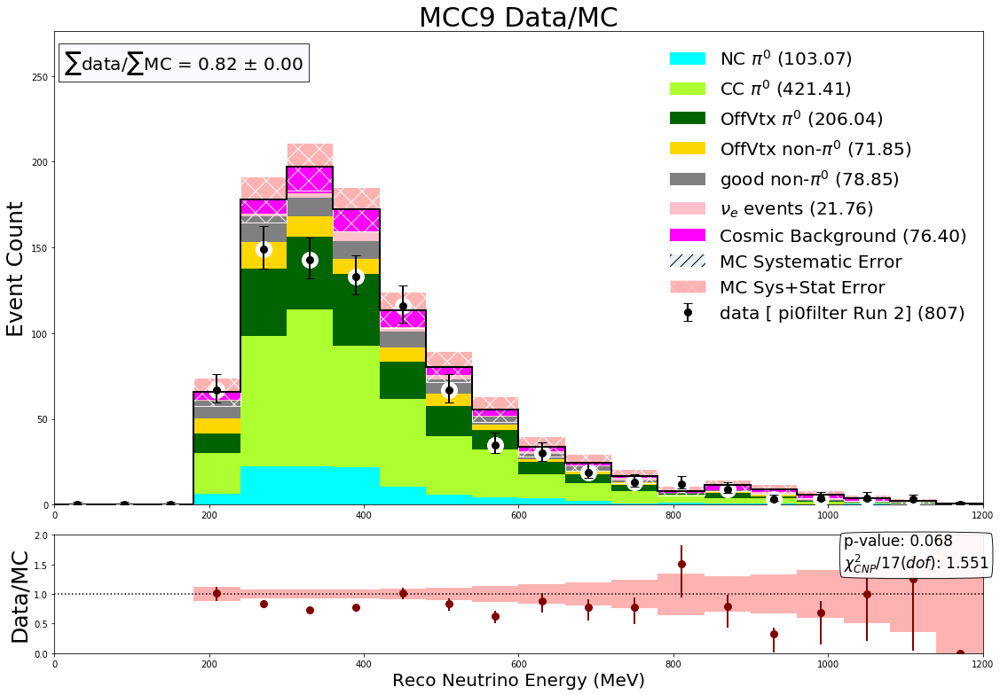

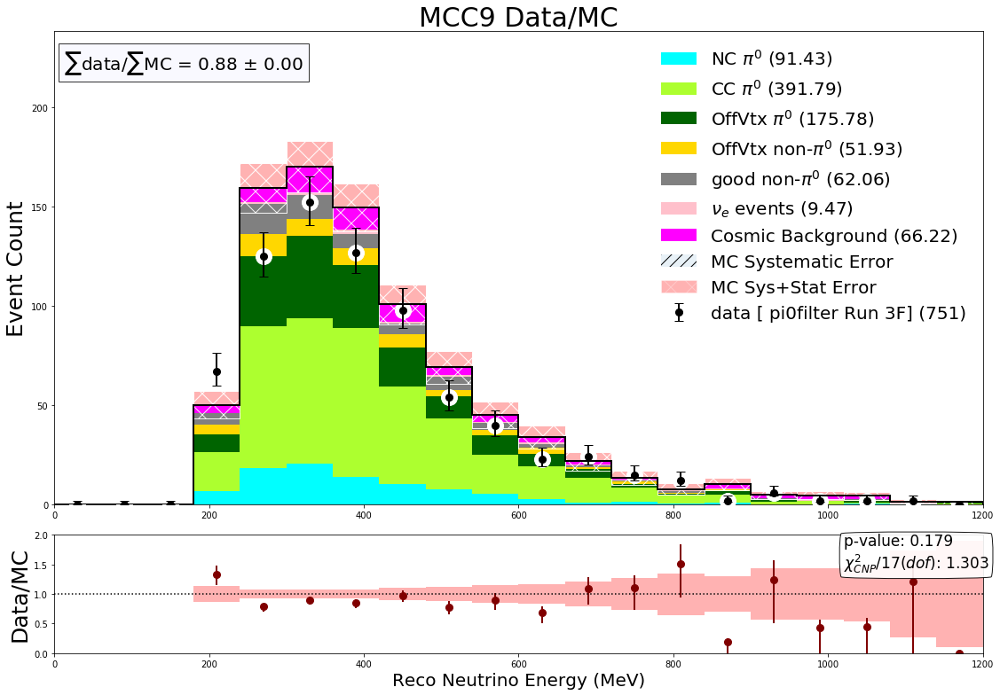

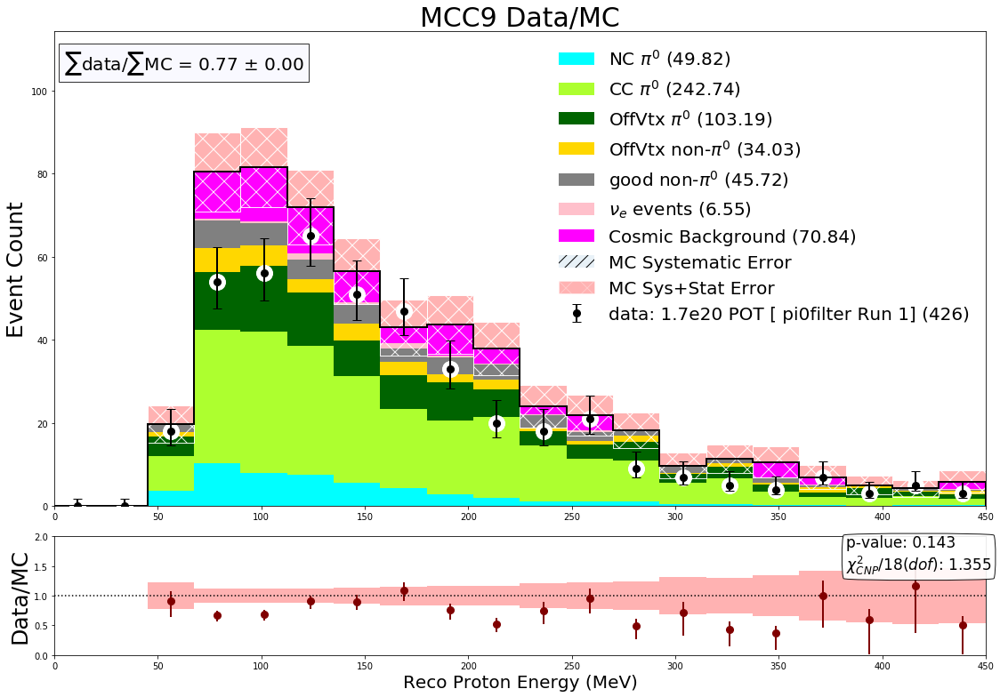

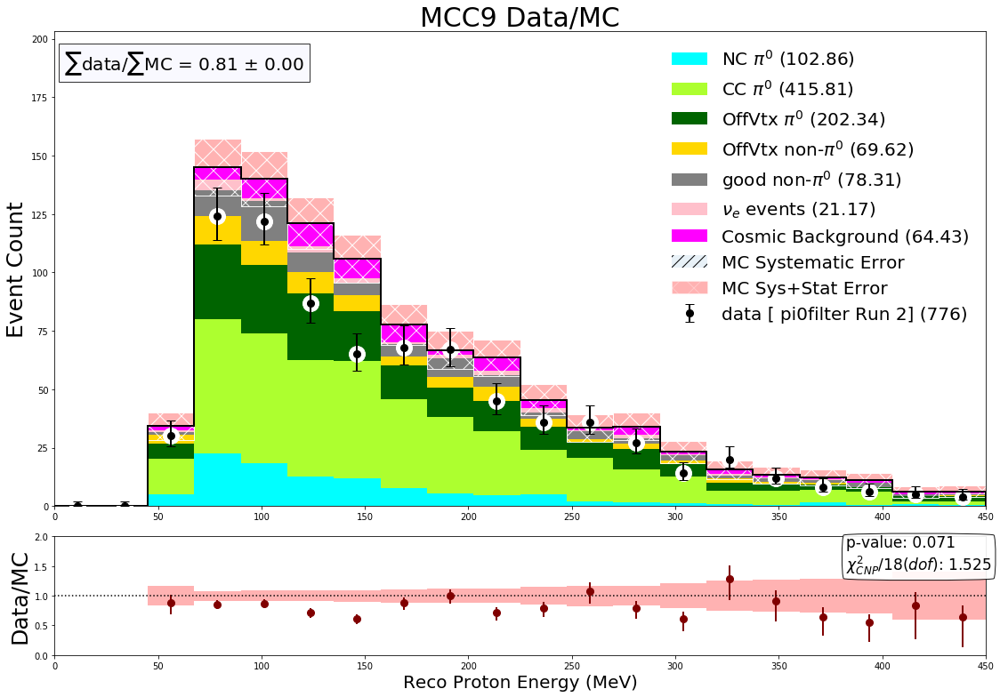

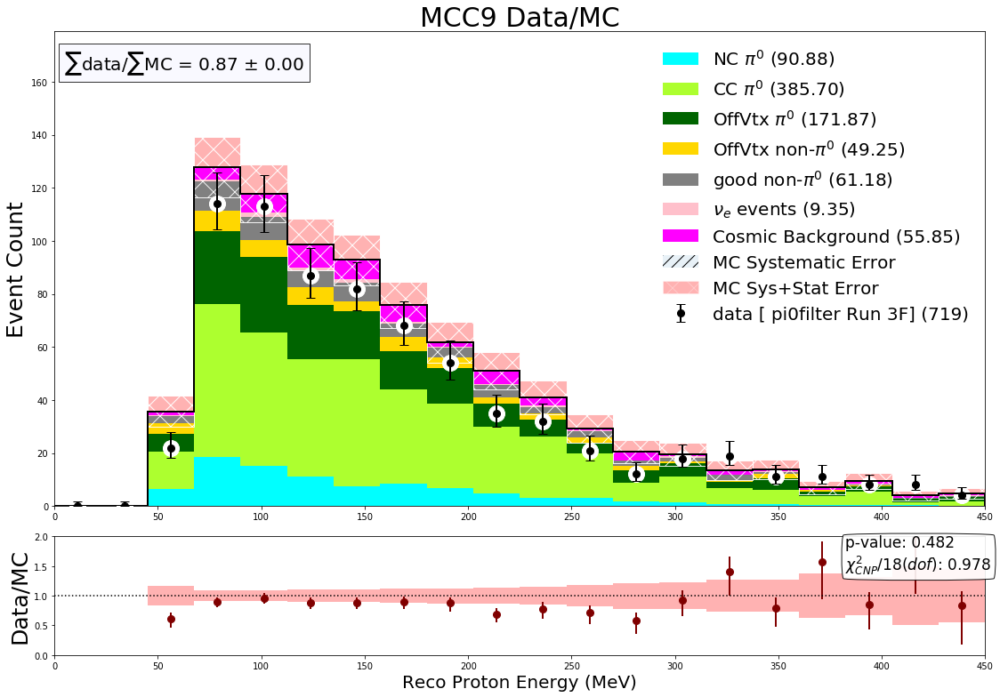

In [21]:
# individual runs again

EXT_R2_PI0FILTER_POT = EXT_R2D_PI0FILTER_POT +EXT_R2E_PI0FILTER_POT
EXT_R3_PI0FILTER_POT = EXT_R3F_PI0FILTER_POT +EXT_R3G_PI0FILTER_POT
EXT_R2_PI0FILTER_SCALE =  (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/ float(EXT_R2_PI0FILTER_POT)
EXT_R3_PI0FILTER_SCALE =  (DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/ float(EXT_R3_PI0FILTER_POT)

norm = 1.0
with PdfPages('output_20210205_individualruns_original.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_numu_1mil_pi0.query('newhaspi0==0'),df_nue_pi0,df_ccpi0_r1_pi0,df_ncpi0_r1_pi0),(1.0,1.0,1.0,1.0))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1  and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r2=df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
        run2D_pi0filter_Hists = StackedHisto((df_numu_r2_1mil_pi0,df_nue_r2_pi0),(1.0,1.0))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2,1.0,0,'','data [ pi0filter Run 2]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r3=df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)
        run3F_pi0filter_Hists = StackedHisto((df_numu_r3_pi0.query('newhaspi0==0'),df_nue_r3_pi0,df_ccpi0_r3_pi0,df_ncpi0_r3_pi0),(1.0,1.0,1.0,1.0))
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run3F_pi0filter_DataHist = SimpleHisto(df_data_r3,1.0,0,'','data [ pi0filter Run 3F]')
        fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

        #save to pdf file of plots
#         pdf.savefig(fig1)
#         pdf.savefig(fig3)
#         pdf.savefig(fig4)
#         pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

In [22]:
print(len(df_numu_pi0.query('newhaspi0==1 and MC_scedr<5 and ccnc==0'))*(DATA_R1_PI0FILTER_POT)/NUMU_R1_POT)
print(len(df_ccpi0_r1_pi0.query('MC_scedr<5'))*(DATA_R1_PI0FILTER_POT)/CCPI0_R1_POT)

244.7322717932732
218.4559009641271


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 1.065028190733844
yerr_mc_total [ 81.73444035 124.17115653 178.92918051 237.65313836 319.88639274
 344.49080666 349.87023553 286.92961818 182.34165934  83.26248688
  66.50710635  44.17314315  41.43175062  28.50964573  21.32553368
  14.97417017  24.51386811  10.94181144  10.41925555  12.22252863]
yerr_data 181.27369413033935
0.708531703172653 0.8217400345807098
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.22799253209615797
yerr_mc_total [ 3.99112555 10.06010373 16.32841816 23.63131614 29.60000101 43.98325996
 42.64065111 56.22769294 50.16333196 47.53260491 42.35860755 42.85714103
 34.36150874 31.36961269 32.86452777 29.84130442 28.5718963

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide


hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          9.32230811 18.5891617  18.35309104 16.72167842
 15.84218421 13.93452747 13.2307086  12.00662055 10.36738245  9.05864966
  8.04748332  7.02415099  6.11929338  6.37052742  4.89908843  4.89405991
  3.52673249  4.22633166]
yerr_data 176.00355099130945
1.869639686633261 0.013894870025918382


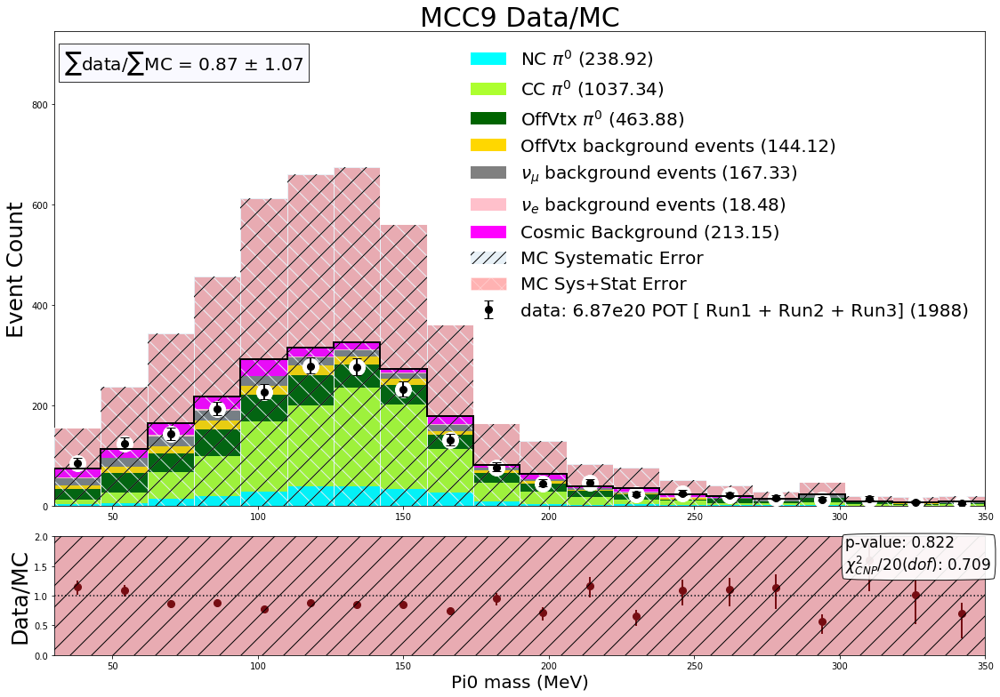

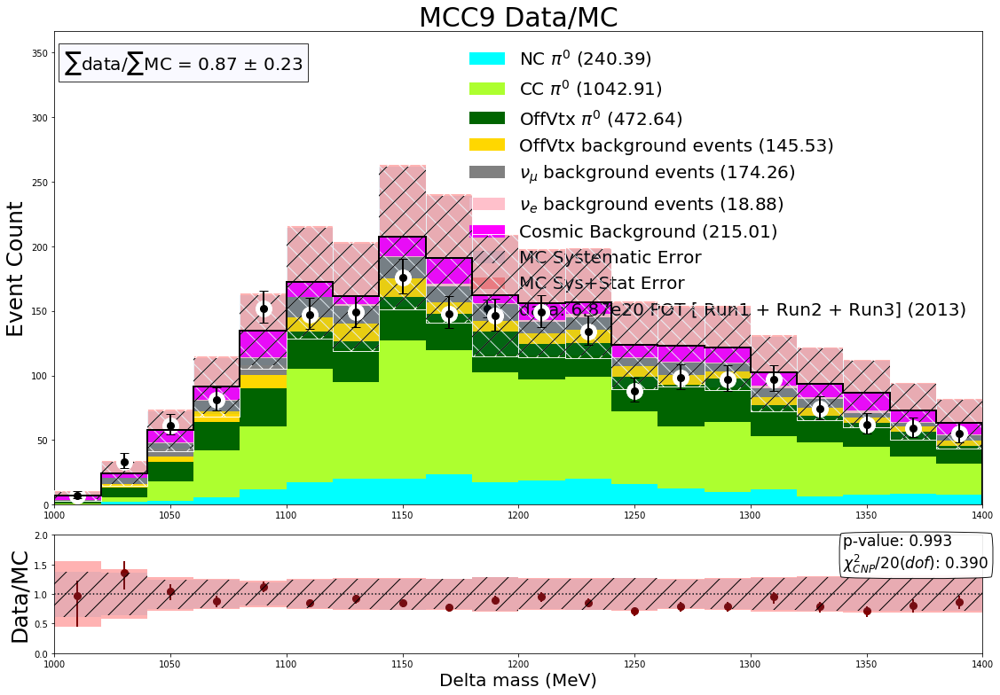

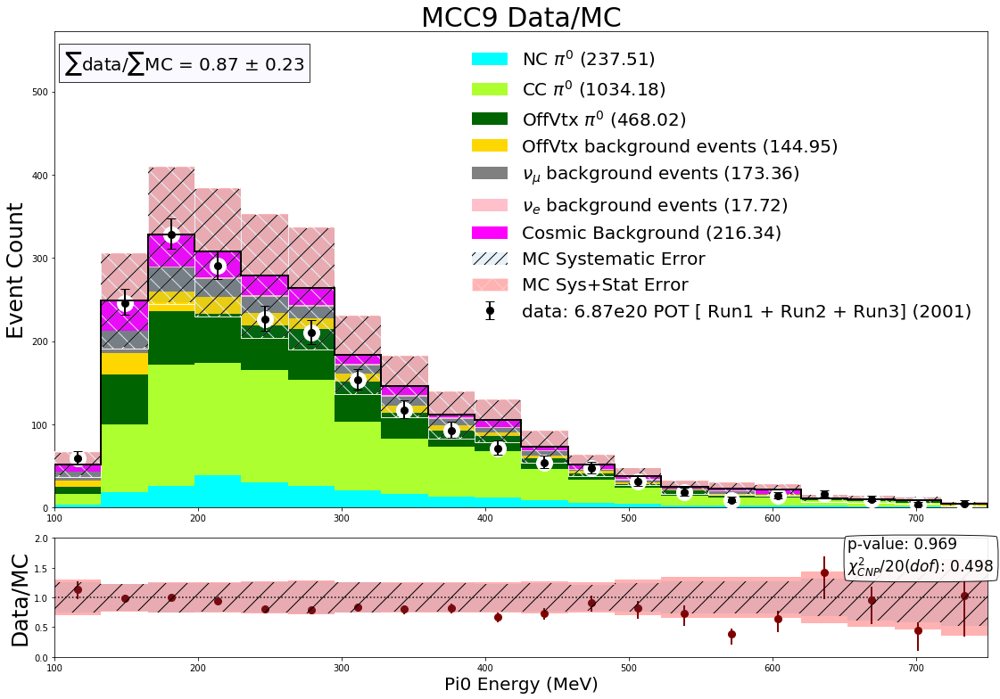

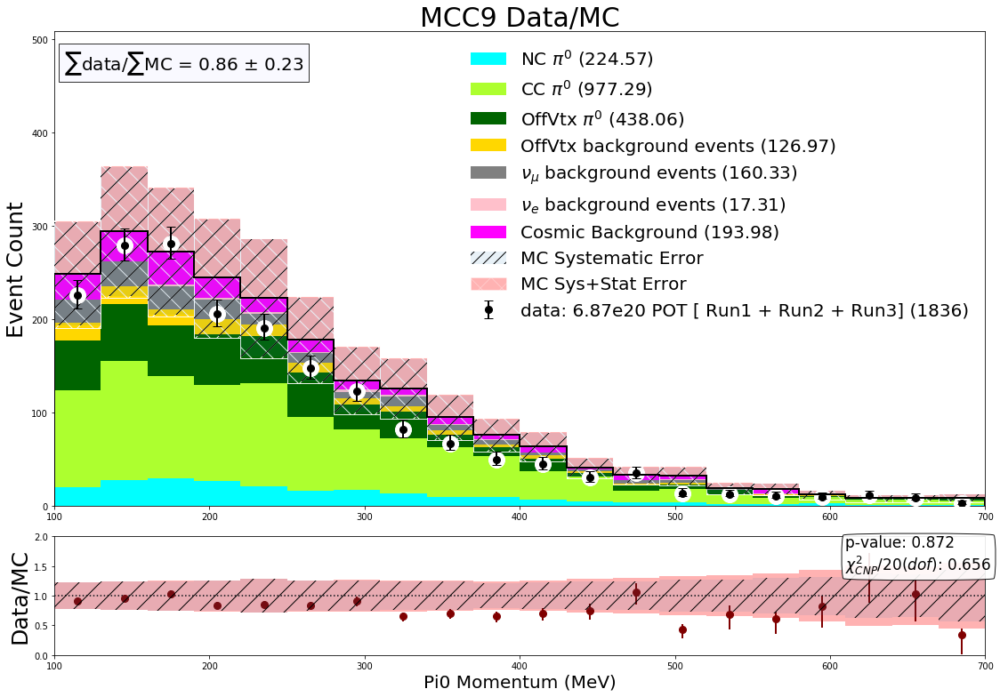

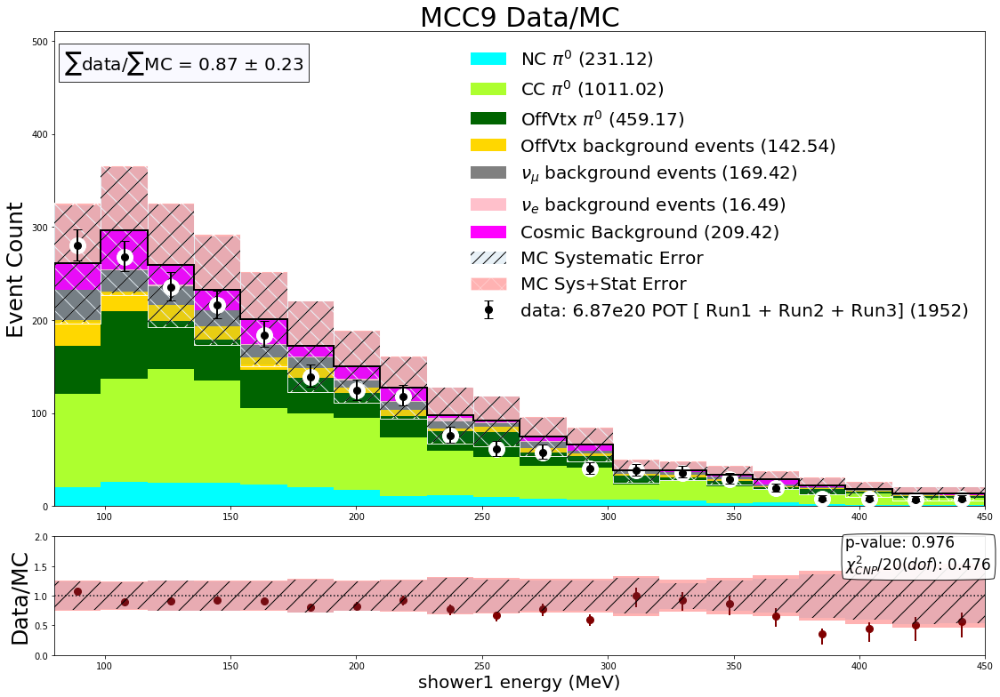

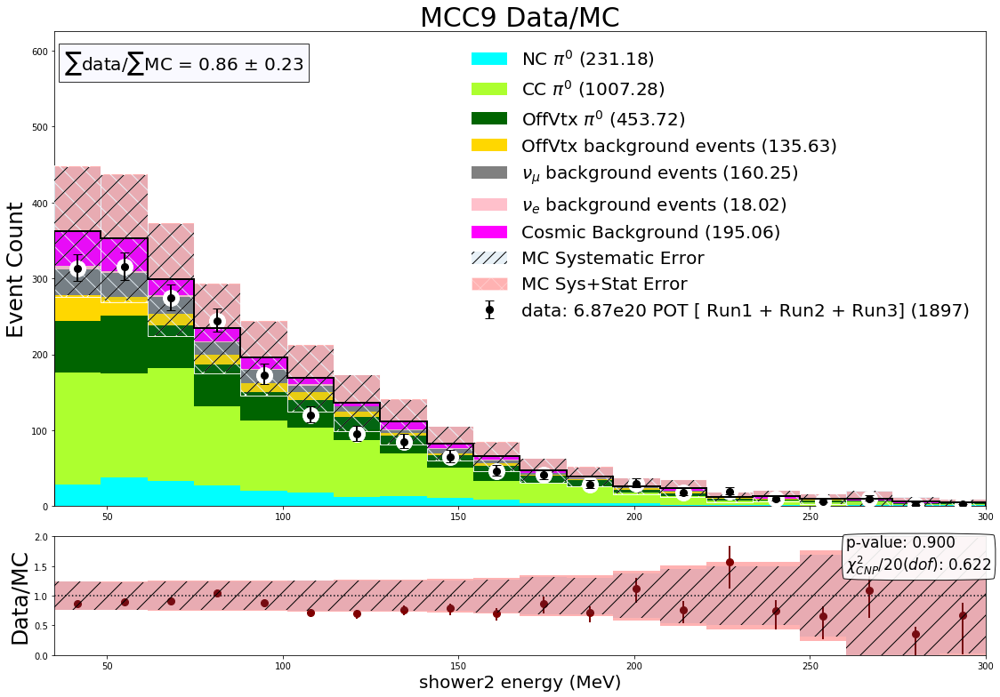

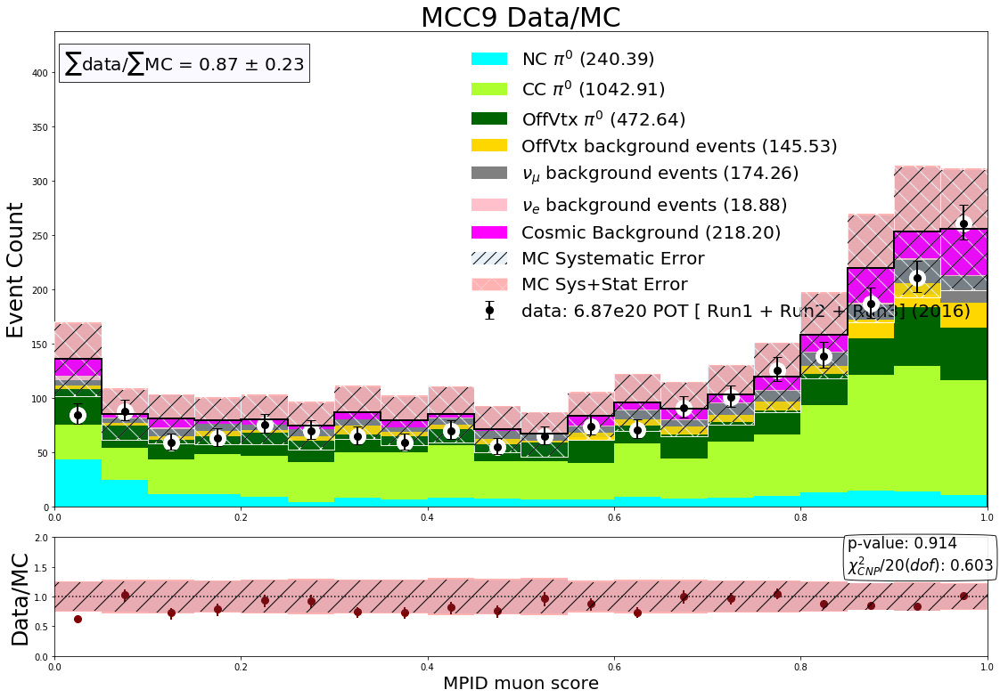

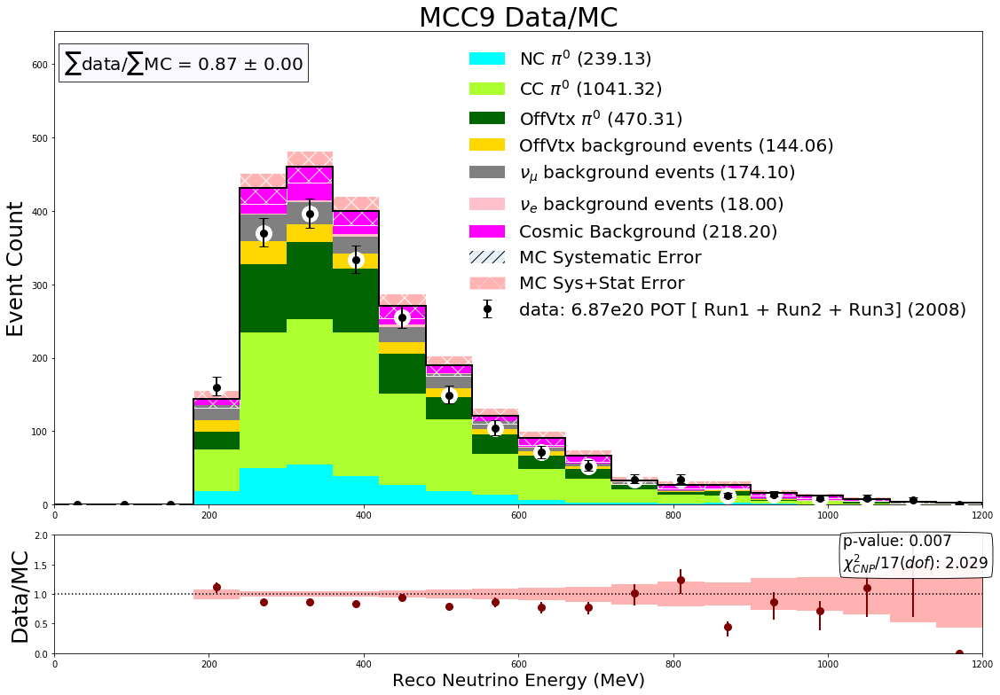

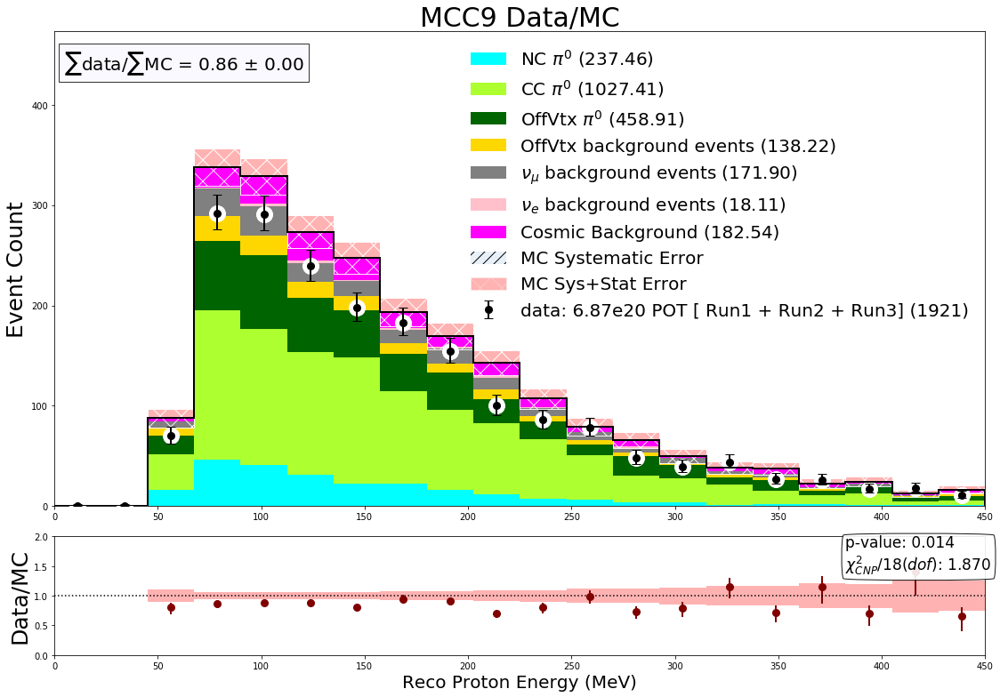

In [23]:
norm = 1.0
print()
with PdfPages('output_combined_20210205_highstatsrun1.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = s_cov +d_cov
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
        fig1.savefig(vartest_list[i]+'_20210413.png')

In [24]:
# # plot the resolution distributions

# first cut for events with a true pi0 with two contained showers.
contained_pi0='haspi0==1 and shower_energy_true >=0 and secondshower_energy_true >=0 '
df_numu_total.query(contained_pi0+'and (newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
df_nue_total.query(contained_pi0+'and MC_parentPDG ==12')
df_ncpi0_total.query(contained_pi0)
df_ccpi0_total.query(contained_pi0)

df_nue_r1=df_nue_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7 ")
df_nue_r2=df_nue_r2_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")
df_nue_r3=df_nue_r3_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")

def getangleres(df):
#     funtion to get the angle between true and reco shower directions
    angleres= []
    for i in range(len(df)):
        recox1 = df['shower1_dir_3d_X'].values[i]
        recoy1 = df['shower1_dir_3d_Y'].values[i]
        recoz1 = df['shower1_dir_3d_Z'].values[i]
        recox2 = df['shower2_dir_3d_X'].values[i]
        recoy2 = df['shower2_dir_3d_Y'].values[i]
        recoz2 = df['shower2_dir_3d_Z'].values[i]
        
        truex1 = df['first_direction_true_X'].values[i]
        truey1 = df['first_direction_true_Y'].values[i]
        truez1 = df['first_direction_true_Z'].values[i]
        truex2 = df['second_direction_true_X'].values[i]
        truey2 = df['second_direction_true_Y'].values[i]
        truez2 = df['second_direction_true_Z'].values[i]
        
        dot1 = recox1*recox2+recoy1*recoy2+recoz1*recoz2
        dot2 = truex1*truex2+truey1*truey2+truez1*truez2
        
        magreco1 = sqrt(recox1**2+recoy1**2+recoz1**2)             
        magreco2 = sqrt(recox2**2+recoy2**2+recoz2**2)
        magtrue1 = sqrt(truex1**2+truey1**2+truez1**2)             
        magtrue2 = sqrt(truex2**2+truey2**2+truez2**2) 
        
        cosdir1 = dot1/(magreco1*magreco2)
        cosdir2 = dot2/(magtrue1*magtrue2)
        alpha1 = acos(cosdir1) * 180.0 / 3.14159
        alpha2 = acos(cosdir2) * 180.0 / 3.14159

        angleres.append((alpha1-alpha2)/alpha2)

    return angleres


# def getangleres(df):
# #     funtion to get the angle between true and reco shower directions
#     angleres1 = []
#     angleres2 = []
#     for i in range(len(df)):
#         recox1 = df['shower1_dir_3d_X'].values[i]
#         recoy1 = df['shower1_dir_3d_Y'].values[i]
#         recoz1 = df['shower1_dir_3d_Z'].values[i]
#         recox2 = df['shower2_dir_3d_X'].values[i]
#         recoy2 = df['shower2_dir_3d_Y'].values[i]
#         recoz2 = df['shower2_dir_3d_Z'].values[i]
        
#         truex1 = df['first_direction_true_X'].values[i]
#         truey1 = df['first_direction_true_Y'].values[i]
#         truez1 = df['first_direction_true_Z'].values[i]
#         truex2 = df['second_direction_true_X'].values[i]
#         truey2 = df['second_direction_true_Y'].values[i]
#         truez2 = df['second_direction_true_Z'].values[i]
        
#         dot1 = recox1*truex1+recoy1*truey1+recoz1*truez1
#         dot2 = recox2*truex2+recoy2*truey2+recoz2*truez2
        
#         magreco1 = sqrt(recox1**2+recoy1**2+recoz1**2)             
#         magreco2 = sqrt(recox2**2+recoy2**2+recoz2**2)
#         magtrue1 = sqrt(truex1**2+truey1**2+truez1**2)             
#         magtrue2 = sqrt(truex2**2+truey2**2+truez2**2) 
        
#         cosdir1 = dot1/(magreco1*magtrue1)
#         cosdir2 = dot2/(magreco2*magtrue2)
# #         angleres1.append(acos(cosdir1) * 180.0 / 3.14159)
# #         angleres2.append(acos(cosdir2) * 180.0 / 3.14159)
#         angleres1.append(cosdir1)
#         angleres2.append(cosdir2)

#     return angleres1,angleres2

def getenergyres(df):
#     funtion to get the angle between true and reco shower directions
    energyres1 = []
    energyres2 = []
    for i in range(len(df)):
        reco1 = df['shower1_E_Y_new'].values[i]
        reco2 = df['shower2_E_Y_new'].values[i]

        true1 = df['shower_energy_true'].values[i]
        true2 = df['secondshower_energy_true'].values[i]
        
        energyres1.append((reco1-true1)/true1)
        energyres2.append((reco2-true2)/true2)
#         energyres2.append(-999)

    return energyres1,energyres2

a1_numu = getangleres(df_numu_total)
e1_numu,e2_numu = getenergyres(df_numu_total)
df_numu_total["AngleRes"]=a1_numu
# df_numu_total["AngleRes2"]=a2_numu
df_numu_total["EnergyRes1"]=e1_numu
df_numu_total["EnergyRes2"]=e2_numu

a1_nue = getangleres(df_nue_total)
e1_nue,e2_nue = getenergyres(df_nue_total)
df_nue_total["AngleRes"]=a1_nue
# df_nue_total["AngleRes2"]=a2_nue
df_nue_total["EnergyRes1"]=e1_nue
df_nue_total["EnergyRes2"]=e2_nue

a1_cc = getangleres(df_ccpi0_total)
e1_cc,e2_cc = getenergyres(df_ccpi0_total)
df_ccpi0_total["AngleRes"]=a1_cc
# df_ccpi0_total["AngleRes2"]=a2_cc
df_ccpi0_total["EnergyRes1"]=e1_cc
df_ccpi0_total["EnergyRes2"]=e2_cc

a1_nc = getangleres(df_ncpi0_total)
e1_nc,e2_nc = getenergyres(df_ncpi0_total)
df_ncpi0_total["AngleRes"]=a1_nc
# df_ncpi0_total["AngleRes2"]=a2_nc
df_ncpi0_total["EnergyRes1"]=e1_nc
df_ncpi0_total["EnergyRes2"]=e2_nc

# e1_nc,e2_nc = getenergyres(df_nue_r1)
# df_nue_r1["EnergyRes1"]=e1_nc
# e1_nc,e2_nc = getenergyres(df_nue_r2)
# df_nue_r2["EnergyRes1"]=e1_nc
# e1_nc,e2_nc = getenergyres(df_nue_r3)
# df_nue_r3["EnergyRes1"]=e1_nc

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:97: RuntimeWarning: divide by zero encountered in double_scalars
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:98: RuntimeWarning: divide by zero encountered in double_scalars


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]


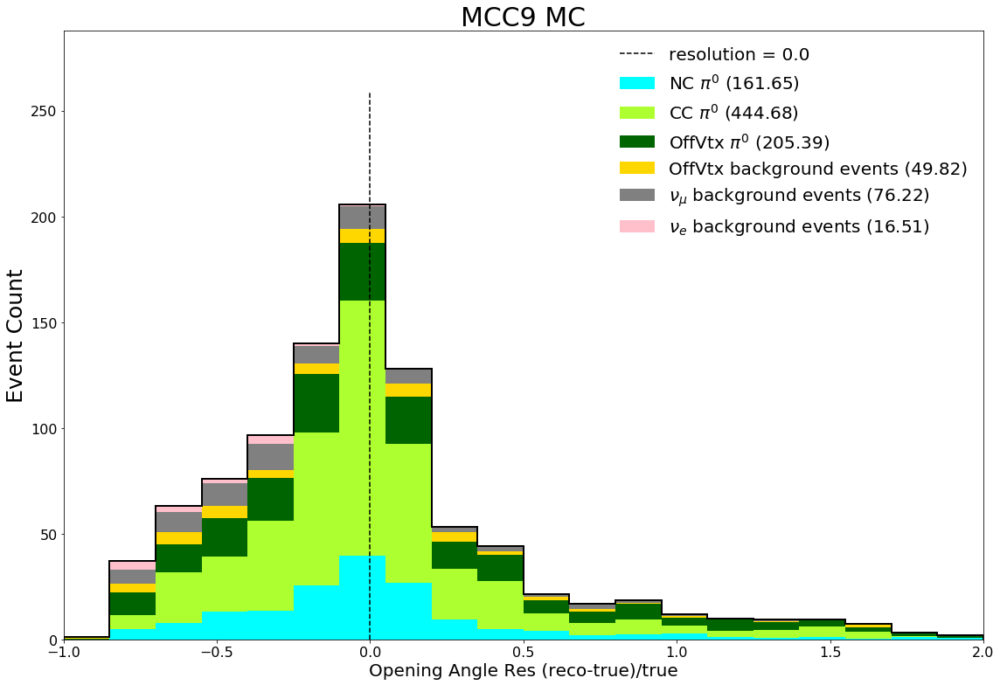

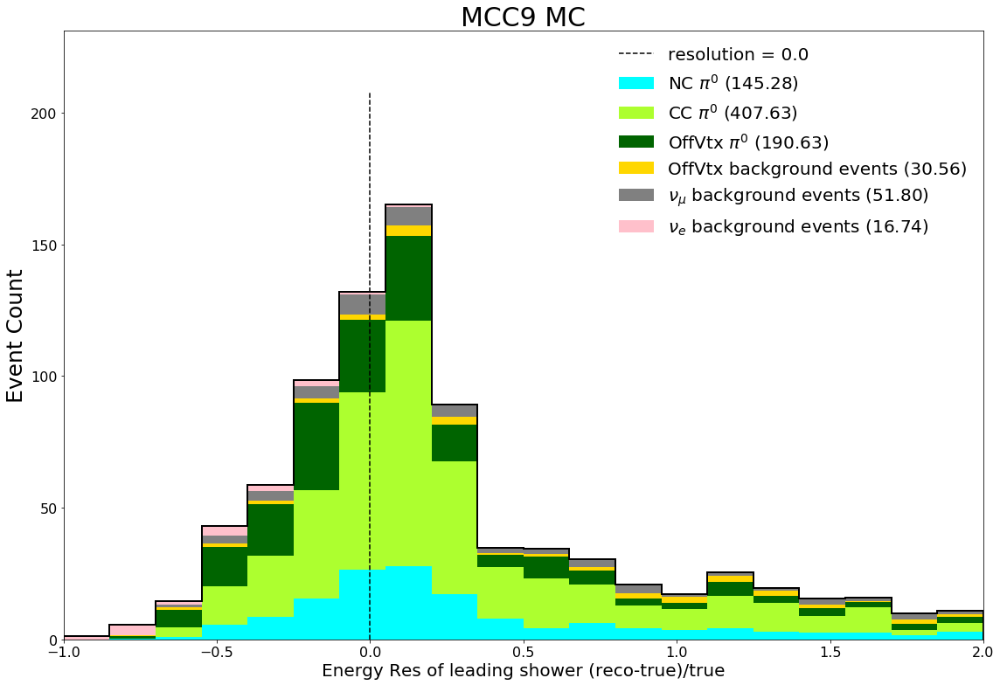

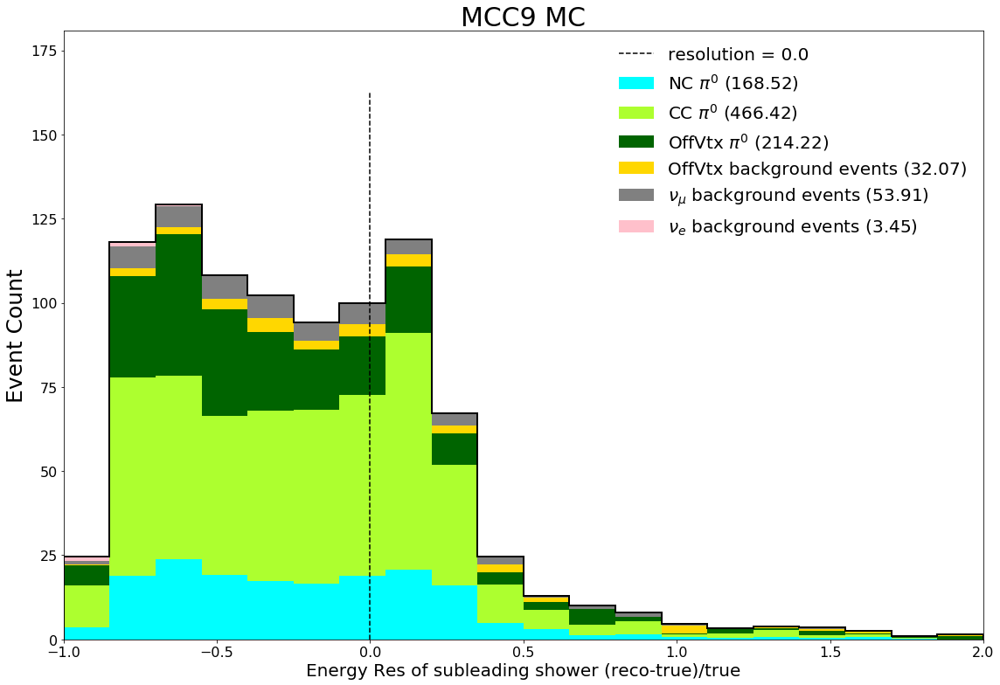

In [26]:
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []


vartest_list.append('AngleRes')
varname_list.append('Opening Angle Res (reco-true)/true')
# myrange_list.append((-1,1))
myrange_list.append((-1,2))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

# vartest_list.append('AngleRes2')
# varname_list.append('Cosine Angle between true and reco subleading showers')
# myrange_list.append((-1,1))
# # myrange_list.append((0,180))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)

vartest_list.append('EnergyRes1')
varname_list.append('Energy Res of leading shower (reco-true)/true')
myrange_list.append((-1,2))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('EnergyRes2')
varname_list.append('Energy Res of subleading shower (reco-true)/true')
myrange_list.append((-1,2))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)



for i in range(len(vartest_list)):
    vartest = vartest_list[i]
    varname = varname_list[i]
    myrange = myrange_list[i]
    nbins =bins_list[i]

    cov = np.zeros((nbins,nbins))
    run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
    run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
    run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
    run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
    run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
    run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
    run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
    fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
    fig1.savefig(vartest_list[i]+'_20210413.png')
    

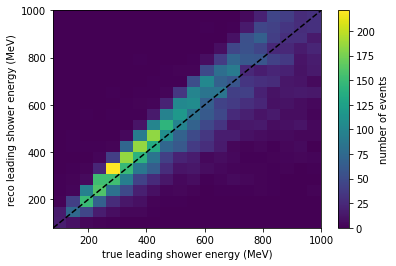

In [39]:
# make 2d hist:
import matplotlib

var_reco =df_nue_r1['shower1_E_Y_new'].values
var_true =df_nue_r1['shower_energy_true'].values

x = [i for i in range(80,1000)]
y = [i for i in range(80,1000)]

plt.hist2d(var_true, var_reco, bins=(20, 20), range = ((80,1000),(80,1000)))
plt.plot(x,y,'--',color = 'black')
plt.xlabel('true leading shower energy (MeV)')
plt.ylabel('reco leading shower energy (MeV)')
plt.colorbar(label='number of events')

plt.show()



[-0.02264954 -0.02196738 -0.62873633 ... -0.14220688  0.17288915
  0.09914432]
hstack gh_weights [1.20593801 1.20593801 1.         ... 1.15510058 1.         1.20708673]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]


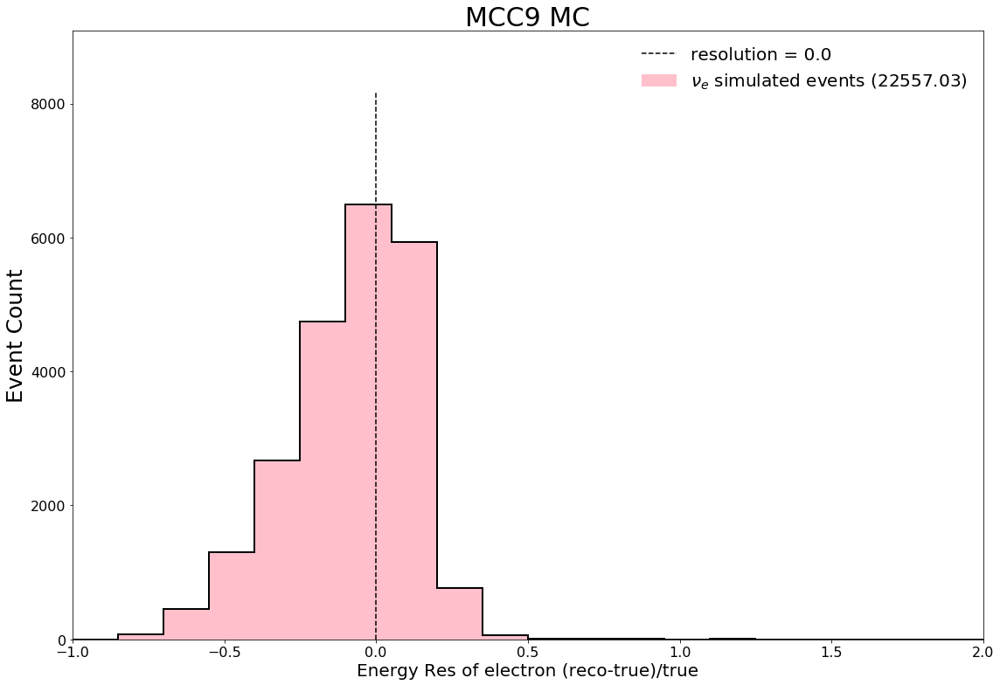

In [26]:
# electron simple resolution

print(df_nue_r1["EnergyRes1"].values)
vartest = "EnergyRes1"
varname = 'Energy Res of electron (reco-true)/true'
myrange = [-1,2]
nbins =20

cov = np.zeros((nbins,nbins))
run1_open_Hists = StackedHisto((df_nue_r1,df_nue_r3,df_nue_r3),(1.0,1.0,1.0))
# run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
# run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
# run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
run1_open_Hists.AddStrata('haspi0==1 or haspi0==0',r"$\nu_e$ simulated events",'pink')
fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
fig1.savefig('electronres_20210413.png')

In [148]:
# # choose mpid muon cut value

# pur_NC = []
# pur_CC = []
# cutvals= [.01*i for i in range(1,99)]

# eff_NC=[]
# eff_CC=[]


# for cut in cutvals:
#     muoncut = str(cut)
#     countcc=len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     totalcc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     countnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and ccnc==1 and MPID_muon <' + muoncut))
#     totalnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon <' + muoncut))
#     pur_CC.append(float(countcc)/float(totalcc))
#     pur_NC.append(float(countnc)/float(totalnc))
#     print(float(countnc)/float(totalnc), cut)
#     eff_CC.append(float(countcc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5' ))))
#     eff_NC.append(float(countnc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==1 and MC_scedr<5' ))))
    
# plt.scatter(cutvals,pur_NC,color ='blue',label = "NC purity",marker='.')
# plt.scatter(cutvals,pur_CC,color ='red',label = "CC purity",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample purity (cc or nc)pi0/totalpi0')
# plt.show()
# plt.close()

# plt.scatter(cutvals,eff_NC,color ='blue',label = "NC eff",marker='.')
# plt.scatter(cutvals,eff_CC,color ='red',label = "CC eff",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample efficiency (cc or nc)pi0 in cut /total(cc or nc) pi0')
# plt.show()

In [139]:
# reset covariance matrices for weighted
detvar1_list  = []
detvar3_list  = []
sys_list = []

sys_list.append('../systematics/covar_pi0_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')


detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__Delta_mass_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__pi0_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__pi0_momentum_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__shower1_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__shower2_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__mpid_muon_score.txt')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.11603052 0.11418823 0.0556453  ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.23242884158686364
yerr_mc_total [1.52090066 3.25480474 3.98940621 6.37131681 6.96856074 8.28566506
 8.87747202 9.01367464 4.94560969 3.31821328 4.23739453 1.53045311
 2.08731767 1.25341428 0.96672382 1.08923269 1.24561514 0.67928811
 1.57451657 0.55823701]
yerr_data 49.71697583480036
1.2094747434200714 0.23421263331490416
hstack gh_weights [0.11603052 0.11418823 0.0556453  ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.23079722002766137
yerr_mc_total [0.         1.12888152 1.44186304 3.3924378  3.77763811 4.77171956
 5.36884631 6.22804371 6.04142322 5.11495925 5.97451521 4.39612103
 4.34948379 4.39505796 3.44149103 2.99712563 2.95290688 3.45094625
 3.35970175 3.61487833]
yerr_data 56.1037

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: divide by zero encountered in true_divide


hstack gh_weights [0.11603052 0.11418823 0.0556453  ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.23339887898207046
yerr_mc_total [1.61124283 6.2774811  9.24599367 8.29113571 7.42460951 6.74571839
 5.9716913  4.33237214 3.73987807 2.98970595 2.42252009 2.39068923
 3.12311336 0.85430035 1.71025666 2.31860474 0.37800614 0.92702448
 0.62782253 0.25694906]
yerr_data 50.236896048815055
0.8867957634549786 0.604799913645939
hstack gh_weights [0.11603052 0.11418823 0.0556453  ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.23269882951087095
yerr_mc_total [6.37434163 6.90354445 8.47000114 6.62872984 5.46355905 5.28118797
 4.51439923 3.81366436 2.54796193 2.59526867 2.9337763  1.73998213
 2.88578953 2.00703059 0.4917234  2.28087991 0.50175753 0.64527103
 0.72314687 0.19223066]
yerr_data 48.32220

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:410: RuntimeWarning: invalid value encountered in true_divide


hstack gh_weights [0.11603052 0.11418823 0.0556453  ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         4.19067184 6.81661808 5.60373824
 5.75382728 5.265526   3.19503782 2.60082196 2.31040101 2.39866521
 1.21324366 0.95525268 1.34850196 1.06681951 0.27014113 0.23267321
 0.22885106 0.15061796]
yerr_data 41.5931137301574
0.9474457993810534 0.5162923805003392
hstack gh_weights [0.11603052 0.11418823 0.0556453  ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         2.72258105 6.71121448 5.673059   4.83449656
 4.78833287 3.95019446 2.86976696 3.00204254 2.60389278 3.09879164
 2.1707826  1.49193851 1.01605968 0.9108838  0.49236179 0.62244264
 0.57776864 0.22186195]
yerr_data 45.557956950704295
1.063485092456775 0.38

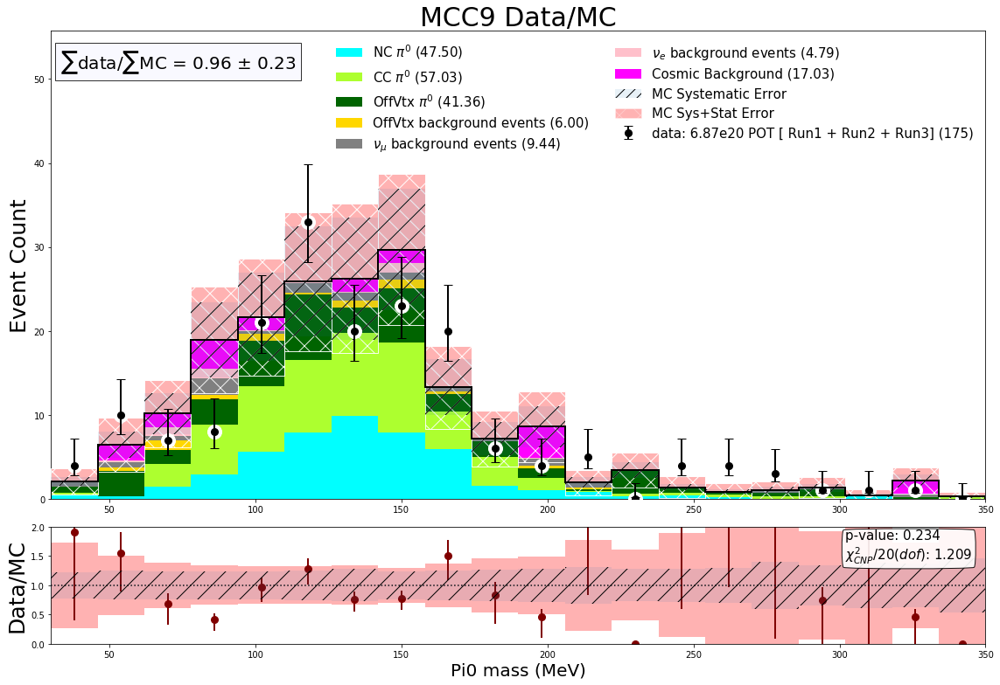

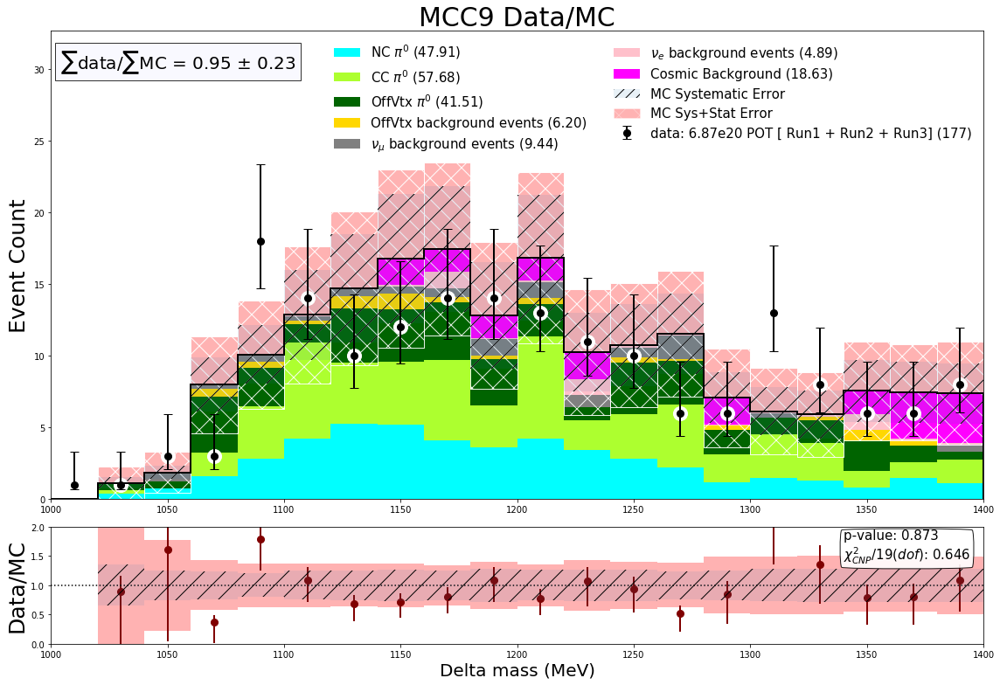

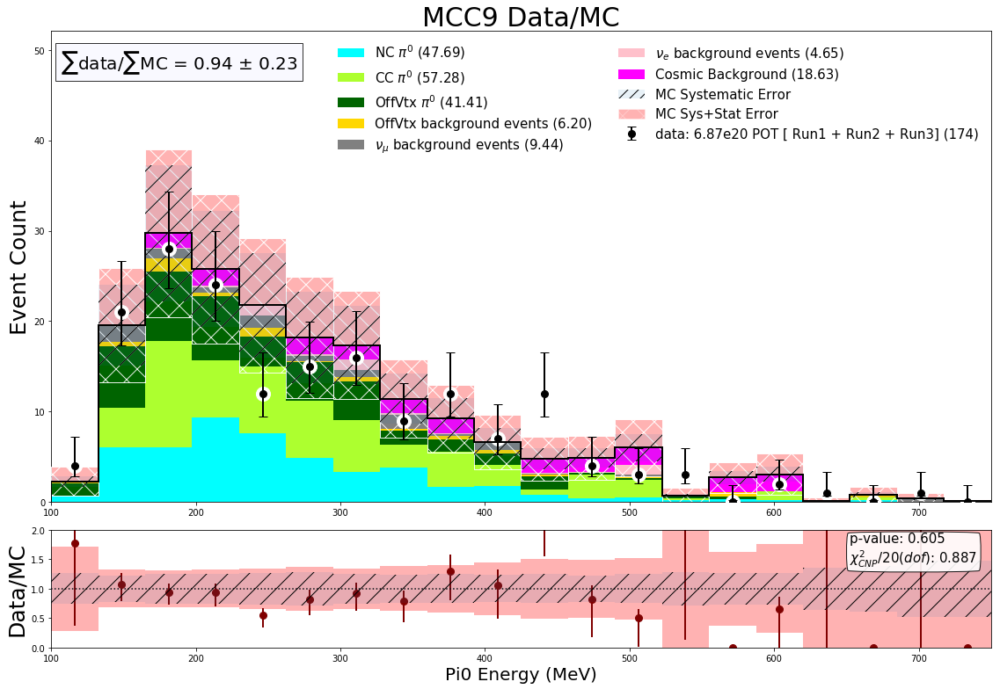

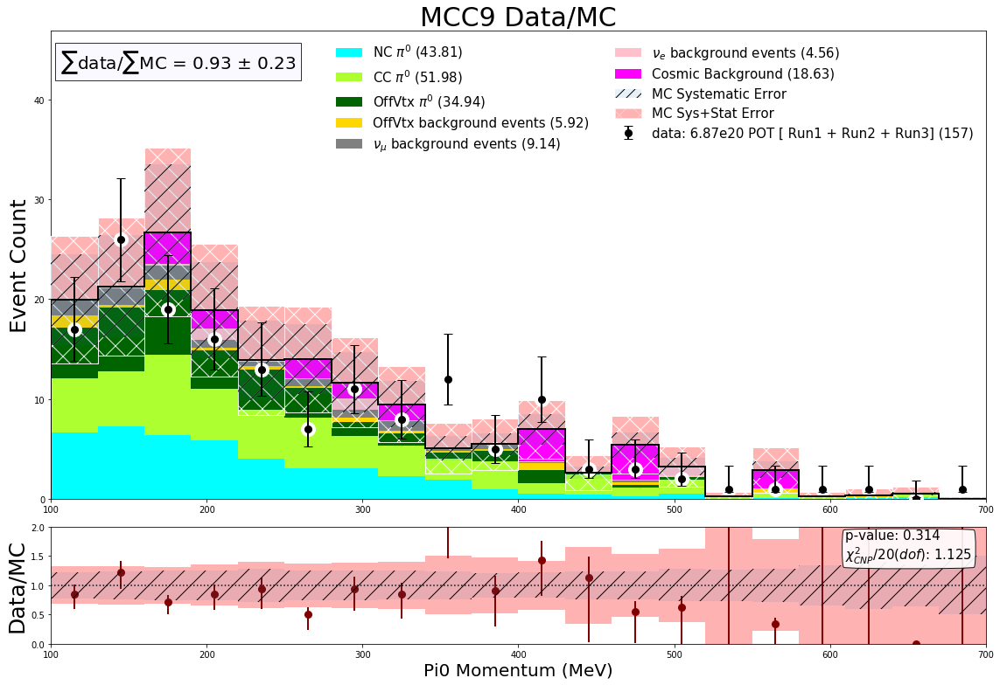

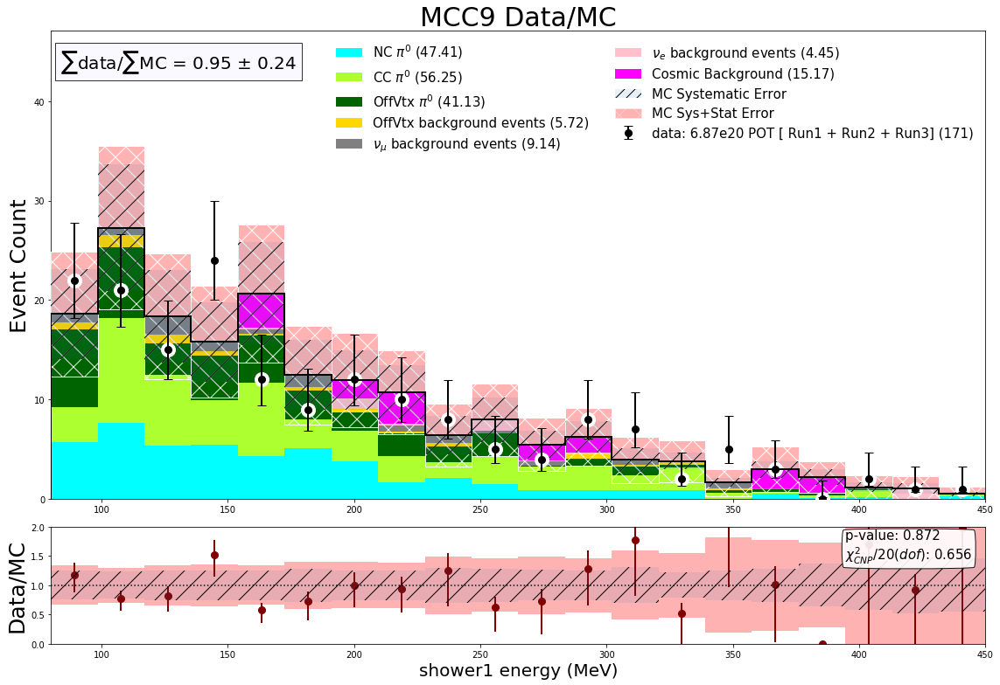

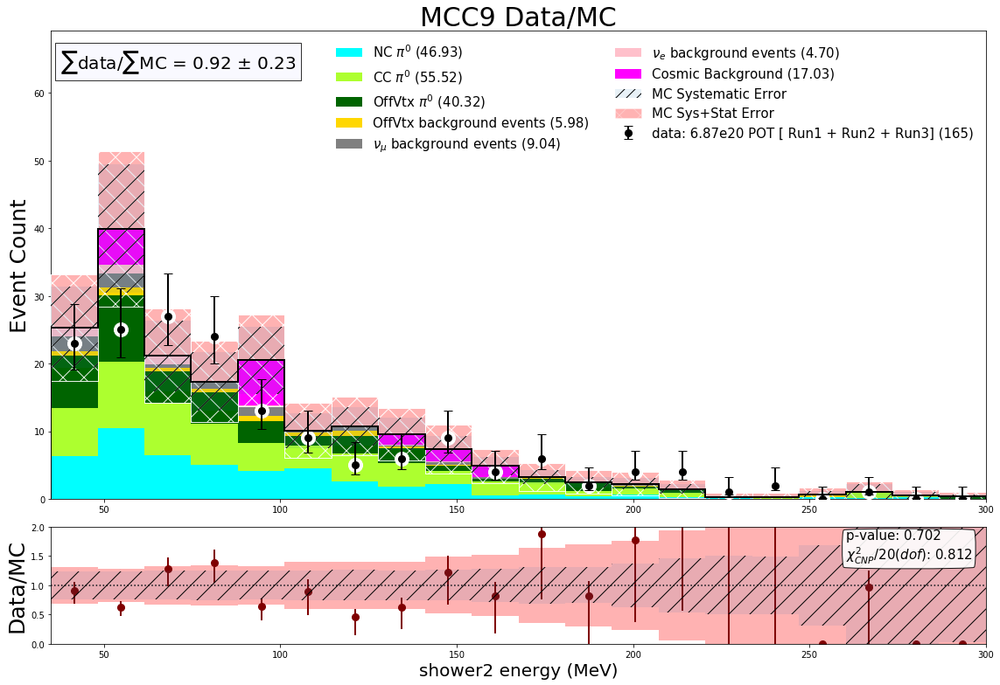

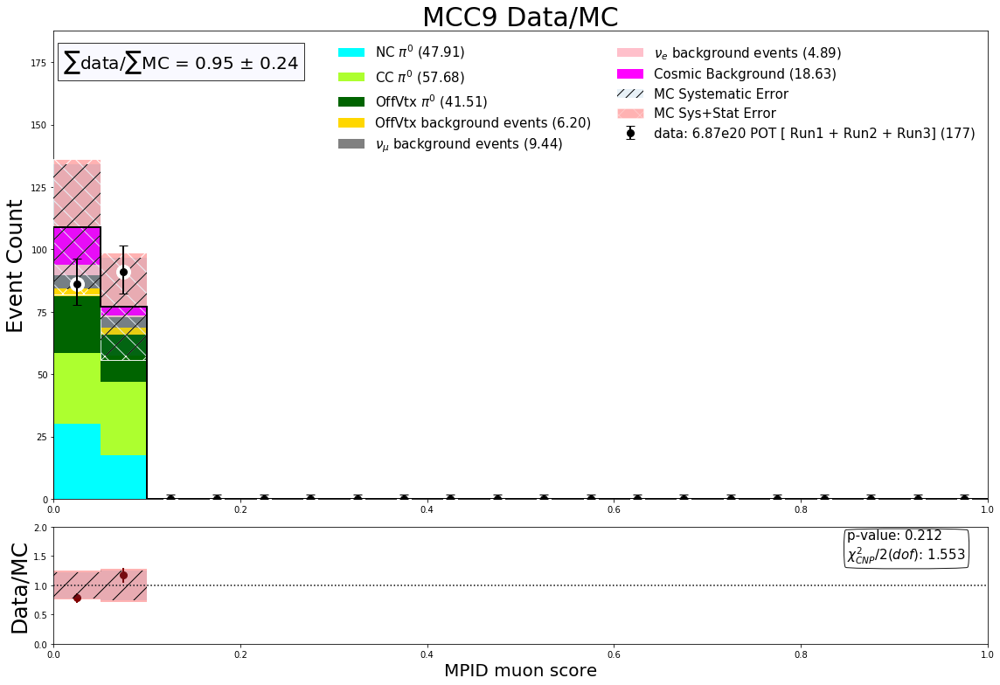

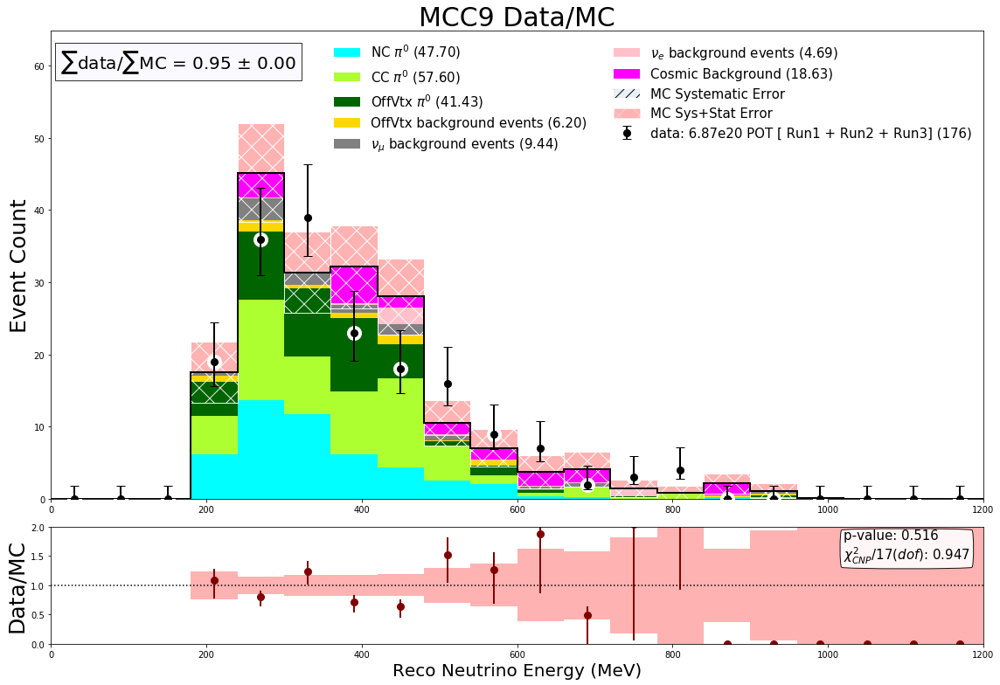

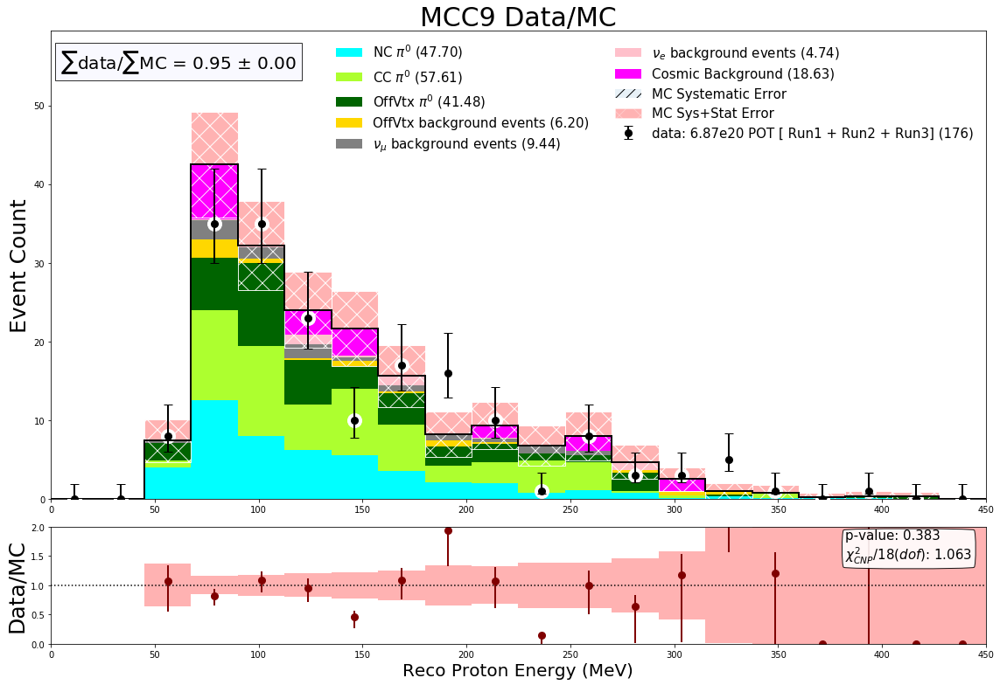

In [140]:
def getweights(df):
    a_CC= 2.75e-06
    b_CC= -0.0032
    c_CC = 1.553

    a_NC= 2.54e-06
    b_NC= -0.0039
    c_NC = 1.494

    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                if(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC <0):
                    weights.append(.001)
                else:
                    weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

def resetweights(df):
    weights_v = []
    for i in range(len(df)):
        weights_v.append(1.0)
    return weights_v

#reset new weights column
# df_numu_total.drop(['new_weight'], axis=1)
# df_nue_total.drop(['new_weight'], axis=1)
# df_ccpi0_total.drop(['new_weight'], axis=1)
# df_ncpi0_total.drop(['new_weight'], axis=1)

# now add in new weights
pi0_new4 = getweights(df_numu_total)
df_numu_total['new_weight'] = pi0_new4

pi0_new8 = resetweights(df_nue_total)
df_nue_total['new_weight'] = pi0_new8

pi0_new5 = getweights(df_ccpi0_total)
df_ccpi0_total['new_weight'] = pi0_new5

pi0_new6 = getweights(df_ncpi0_total)
df_ncpi0_total['new_weight'] = pi0_new6

# print(df_ncpi0_total['new_weight'])
# print(df_ccpi0_total['new_weight'])

with PdfPages('output_combined_20201109_weighted.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = s_cov +d_cov
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
        pdf.savefig(fig1)

QE count:  55
Res count:  659
Dis count:  202
Coh count:  2
MEC count:  15
[  0.   9.  78. 152. 140. 127. 113.  98.  57.  34.  28.  34.  23.  13.
   9.   4.   6.   3.   1.   0.] 929.0
55
2
0


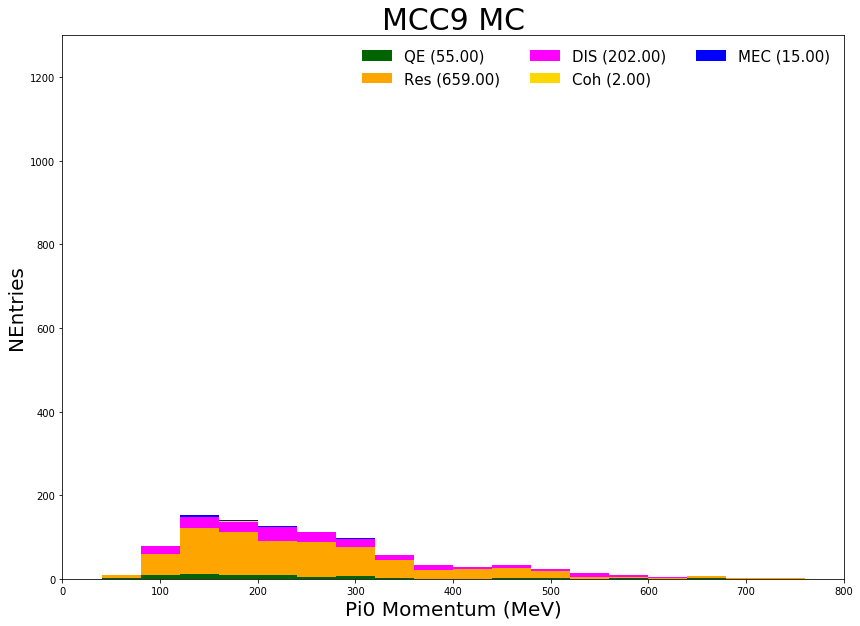

In [130]:
var_bnb_QE = df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Res = df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Dis = df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Coh = df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_MEC = df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")['pi0_momentum_reco'].values

print("QE count: ",len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print("Res count: ",len(df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")))
print("Dis count: ",len(df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")))
print("Coh count: ",len(df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")))
print("MEC count: ",len(df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")))

fig,ax = plt.subplots(figsize=(14,10))
_hists=[var_bnb_QE,var_bnb_Res,var_bnb_Dis,var_bnb_Coh,var_bnb_MEC]
tmp_colors = ['darkgreen','orange','magenta','gold','blue']
myrange = (0,800)
nbins = 20
ymax =1300
tmp_labels = ['QE'+' (%.2f)'%len(var_bnb_QE),'Res'+' (%.2f)'%len(var_bnb_Res),'DIS'+' (%.2f)'%len(var_bnb_Dis),'Coh'+' (%.2f)'%len(var_bnb_Coh),'MEC'+' (%.2f)'%len(var_bnb_MEC)]

fig.patch.set_alpha(1)
vals_mc = np.zeros(nbins)

for i in range(0,len(_hists)):
    v1,binedges = np.histogram(_hists[i],nbins,range=myrange)
    vals_mc += v1

print (vals_mc, sum(vals_mc))


bincenters = np.diff(binedges)/2 + binedges[:-1]     

plt.ylim(0,ymax)
plt.xlim(myrange)
ax.set_xlabel("Pi0 Momentum (MeV)",fontsize=20)
ax.set_ylabel('NEntries',fontsize=20)
ax.set_title('MCC9 MC',fontsize=30)

plt.hist(_hists,nbins,range=myrange,color=tmp_colors,stacked=True,linewidth=2.5,label=tmp_labels,edgecolor='None')

ax.legend(loc='upper right',fontsize=15,frameon=False,ncol=3)

print(len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_type ==1096 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_mode ==0 and nu_interaction_type ==1096 and haspi0==1 and MC_scedr<5")))

## Save selection for Lauren

In [25]:
def getpi0weights(df):
    a_CC= 3.425e-06
    b_CC= -0.0039
    c_CC = 1.784

    a_NC= 1.885e-06
    b_NC= -0.00316
    c_NC = 1.442


    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

weights1mu = getpi0weights(df_numu_1mil_pi0)
weights2mu = getpi0weights(df_numu_r2_1mil_pi0)
weights3mu = getpi0weights(df_numu_r3_pi0)
weights1e = getpi0weights(df_nue_pi0)
weights2e = getpi0weights(df_nue_r2_pi0)
weights3e = getpi0weights(df_nue_r3_pi0)
weights1cc = getpi0weights(df_ccpi0_r1_pi0)
weights3cc = getpi0weights(df_ccpi0_r3_pi0)
weights1nc = getpi0weights(df_ncpi0_r1_pi0)
weights3nc = getpi0weights(df_ncpi0_r3_pi0)

df_numu_1mil_pi0['pi0_weight']=weights1mu
df_numu_r2_1mil_pi0['pi0_weight']=weights2mu
df_numu_r3_pi0['pi0_weight']=weights3mu
df_nue_pi0['pi0_weight']=weights1e
df_nue_r2_pi0['pi0_weight']=weights2e
df_nue_r3_pi0['pi0_weight']=weights3e
df_ccpi0_r1_pi0['pi0_weight']=weights1cc
df_ccpi0_r3_pi0['pi0_weight']=weights3cc
df_ncpi0_r1_pi0['pi0_weight']=weights1nc
df_ncpi0_r3_pi0['pi0_weight']=weights3nc

In [26]:
df_numu_pi0=df_numu_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_pi0=df_nue_pi0.query("MC_parentPDG ==12")

file1 = open("2021Apr02_pi0selection_bnb_overlay_run1.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
for event in range(len(df_numu_pi0)):
    teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])+","+str(df_numu_pi0['_pi0mass_new'].values[event])+","+str(df_numu_pi0['DeltaMass_new'].values[event])
    teststr2 =","+ str(df_numu_pi0['shower1_E_Y_new'].values[event])+","+str(df_numu_pi0['shower2_E_Y_new'].values[event])+","+ str(df_numu_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_numu_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_numu_pi0['MPID_muon'].values[event])+","+ str(df_numu_pi0['pi0_weight'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021Apr02_pi0selection_nue_intrinsic_run1.txt","w")
file2.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
for event in range(len(df_nue_pi0)):
    teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])+","+str(df_nue_pi0['_pi0mass_new'].values[event])+","+str(df_nue_pi0['DeltaMass_new'].values[event])
    teststr2 =","+  str(df_nue_pi0['shower1_E_Y_new'].values[event])+","+str(df_nue_pi0['shower2_E_Y_new'].values[event])+","+ str(df_nue_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_nue_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_nue_pi0['MPID_muon'].values[event])+","+ str(df_nue_pi0['pi0_weight'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021Apr02_pi0selection_ext_run1.txt","w")
file3.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
for event in range(len(df_ext_pi0)):
    teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])+","+str(df_ext_pi0['_pi0mass_new'].values[event])+","+str(df_ext_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_ext_pi0['shower1_E_Y_new'].values[event])+","+str(df_ext_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ext_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ext_pi0['pi0_momentum_reco'].values[event])+","+ str(df_ext_pi0['MPID_muon'].values[event])+","+'1.0'+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()


In [27]:
df_numu_r2_1mil_pi0=df_numu_r2_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r2_pi0=df_nue_r2_pi0.query("MC_parentPDG ==12")

file1 = open("2021Apr02_pi0selection_bnb_overlay_run2.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight, true neutrino energy]\n")
for event in range(len(df_numu_r2_1mil_pi0)):
    teststr = "[" +str(df_numu_r2_1mil_pi0['run'].values[event])+","+str(df_numu_r2_1mil_pi0['subrun'].values[event])+","+str(df_numu_r2_1mil_pi0['event'].values[event])+","+str(df_numu_r2_1mil_pi0['_pi0mass_new'].values[event])+","+str(df_numu_r2_1mil_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_numu_r2_1mil_pi0['shower1_E_Y_new'].values[event])+","+str(df_numu_r2_1mil_pi0['shower2_E_Y_new'].values[event])+","+ str(df_numu_r2_1mil_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_numu_r2_1mil_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_numu_r2_1mil_pi0['MPID_muon'].values[event])+","+ str(df_numu_r2_1mil_pi0['pi0_weight'].values[event])+","+ str(df_numu_r2_1mil_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021Apr02_pi0selection_nue_intrinsic_run2.txt","w")
file2.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
for event in range(len(df_nue_r2_pi0)):
    teststr = "[" +str(df_nue_r2_pi0['run'].values[event])+","+str(df_nue_r2_pi0['subrun'].values[event])+","+str(df_nue_r2_pi0['event'].values[event])+","+str(df_nue_r2_pi0['_pi0mass_new'].values[event])+","+str(df_nue_r2_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_nue_r2_pi0['shower1_E_Y_new'].values[event])+","+str(df_nue_r2_pi0['shower2_E_Y_new'].values[event])+","+ str(df_nue_r2_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_nue_r2_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_nue_r2_pi0['MPID_muon'].values[event])+","+ str(df_nue_r2_pi0['pi0_weight'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()


In [31]:
df_numu_r3_pi0=df_numu_r3_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r3_pi0=df_nue_r3_pi0.query("MC_parentPDG ==12")

file1 = open("2021Apr02_pi0selection_bnb_overlay_run3.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon,weight]\n")
for event in range(len(df_numu_r3_pi0)):
    teststr = "[" +str(df_numu_r3_pi0['run'].values[event])+","+str(df_numu_r3_pi0['subrun'].values[event])+","+str(df_numu_r3_pi0['event'].values[event])+","+str(df_numu_r3_pi0['_pi0mass_new'].values[event])+","+str(df_numu_r3_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_numu_r3_pi0['shower1_E_Y_new'].values[event])+","+str(df_numu_r3_pi0['shower2_E_Y_new'].values[event])+","+ str(df_numu_r3_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_numu_r3_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_numu_r3_pi0['MPID_muon'].values[event])+","+ str(df_numu_r3_pi0['pi0_weight'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021Apr02_pi0selection_nue_intrinsic_run3.txt","w")
file2.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon,weight]\n")
for event in range(len(df_nue_r3_pi0)):
    teststr = "[" +str(df_nue_r3_pi0['run'].values[event])+","+str(df_nue_r3_pi0['subrun'].values[event])+","+str(df_nue_r3_pi0['event'].values[event])+","+str(df_nue_r3_pi0['_pi0mass_new'].values[event])+","+str(df_nue_r3_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_nue_r3_pi0['shower1_E_Y_new'].values[event])+","+str(df_nue_r3_pi0['shower2_E_Y_new'].values[event])+","+ str(df_nue_r3_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_nue_r3_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_nue_r3_pi0['MPID_muon'].values[event])+","+ str(df_nue_r3_pi0['pi0_weight'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021Apr02_pi0selection_ext_run3.txt","w")
file3.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
for event in range(len(df_ext_r3_pi0)):
    teststr = "[" +str(df_ext_r3_pi0['run'].values[event])+","+str(df_ext_r3_pi0['subrun'].values[event])+","+str(df_ext_r3_pi0['event'].values[event])+","+str(df_ext_r3_pi0['_pi0mass_new'].values[event])+","+str(df_ext_r3_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_ext_r3_pi0['shower1_E_Y_new'].values[event])+","+str(df_ext_r3_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ext_r3_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ext_r3_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_ext_r3_pi0['MPID_muon'].values[event])+","+'1.0'+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()

In [30]:
file1 = open("2021Apr02_pi0selection_CCPi0_run1.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon,weight]\n")
for event in range(len(df_ccpi0_r1_pi0)):
    teststr = "[" +str(df_ccpi0_r1_pi0['run'].values[event])+","+str(df_ccpi0_r1_pi0['subrun'].values[event])+","+str(df_ccpi0_r1_pi0['event'].values[event])+","+str(df_ccpi0_r1_pi0['_pi0mass_new'].values[event])+","+str(df_ccpi0_r1_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_ccpi0_r1_pi0['shower1_E_Y_new'].values[event])+","+str(df_ccpi0_r1_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ccpi0_r1_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ccpi0_r1_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_ccpi0_r1_pi0['MPID_muon'].values[event])+","+ str(df_ccpi0_r1_pi0['pi0_weight'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021Apr02_pi0selection_CCPi0_run3.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon,weight]\n")
for event in range(len(df_ccpi0_r3_pi0)):
    teststr = "[" +str(df_ccpi0_r3_pi0['run'].values[event])+","+str(df_ccpi0_r3_pi0['subrun'].values[event])+","+str(df_ccpi0_r3_pi0['event'].values[event])+","+str(df_ccpi0_r3_pi0['_pi0mass_new'].values[event])+","+str(df_ccpi0_r3_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_ccpi0_r3_pi0['shower1_E_Y_new'].values[event])+","+str(df_ccpi0_r3_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ccpi0_r3_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ccpi0_r3_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_ccpi0_r3_pi0['MPID_muon'].values[event])+","+ str(df_ccpi0_r3_pi0['pi0_weight'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()



In [29]:
file1 = open("2021Apr02_pi0selection_NCPi0_run1.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon,weight]\n")
for event in range(len(df_ncpi0_r1_pi0)):
    teststr = "[" +str(df_ncpi0_r1_pi0['run'].values[event])+","+str(df_ncpi0_r1_pi0['subrun'].values[event])+","+str(df_ncpi0_r1_pi0['event'].values[event])+","+str(df_ncpi0_r1_pi0['_pi0mass_new'].values[event])+","+str(df_ncpi0_r1_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_ncpi0_r1_pi0['shower1_E_Y_new'].values[event])+","+str(df_ncpi0_r1_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ncpi0_r1_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ncpi0_r1_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_ncpi0_r1_pi0['MPID_muon'].values[event])+","+ str(df_ncpi0_r1_pi0['pi0_weight'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021Apr02_pi0selection_NCPi0_run3.txt","w")
file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon,weight]\n")
for event in range(len(df_ncpi0_r3_pi0)):
    teststr = "[" +str(df_ncpi0_r3_pi0['run'].values[event])+","+str(df_ncpi0_r3_pi0['subrun'].values[event])+","+str(df_ncpi0_r3_pi0['event'].values[event])+","+str(df_ncpi0_r3_pi0['_pi0mass_new'].values[event])+","+str(df_ncpi0_r3_pi0['DeltaMass_new'].values[event])
    teststr2 = ","+ str(df_ncpi0_r3_pi0['shower1_E_Y_new'].values[event])+","+str(df_ncpi0_r3_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ncpi0_r3_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ncpi0_r3_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_ncpi0_r3_pi0['MPID_muon'].values[event])+","+str(df_ncpi0_r3_pi0['pi0_weight'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()
